# 380CT Theoretical Aspects of Computer Science - 2021JanMay

This Jupyter Notebook contains models relevant to the 380CT module as per assignment requirements which can be seen `380CT_Assignment/Assignment_Brief.pdf`

### Project Colaborators
* Jack Allen
* Antonio Cardoso Queiroz da Silva Roque
* Gheorghe Craciun
* Francisco Gaspar Ramos
* Goncalo Lima Carvalheda

# Exploritory Research of Ant Colonisation and Genetic Algorithm Approaches to The Travelling Salesman Problem Against Compared The Greedy Approach

&ensp;

## IMPORTANT NOTES FOR MARKING

No simulations will be executed within this notebook. 

<br>

Results from simulations are read from csv files meaning runtime for this section of the notebook will be negligible.

<br>

Local Execution of this section of the notebook is advised in order to view interactive graphs provided by Plotly for optimal viewing experience as static image representations are of a lesser quality.


&ensp;

All visualisations will also be stored as images embedded within the notebook in case cells are not executed. However, this will result in graphs of a lesser quality when compared to interactive plots which are easily scalable to work more optimally with data rich visualisations.
<br>

If you do not already have necessary dependencies which are listed near the top of this notebook, please see `README.md` for Conda virtual environment setup.


&ensp;


### Plotly Interactive Visualisation Functionality
- Click on elements in the legend to toggle visibility
- Draw box around area you wish to view in more detail to pan
- Double click graph when focused (zoomed in on) an area within graph to return to full view
- Utilise menu within each graph located at the top right for additional functionality

### What is the travelling salesman probelm (TSP)?
“Given a list of cities and the distances between each pair of cities, what is the shortest possible route that visits each city and returns to the origin city?”


In other words:
1. Each city needs to be visited exactly once and no more than that.
2. The route must return to the starting city by taking the shortest calculated route (may not actually be the shortest route).

# 3) Solution Methods
## 3.1) Exact Method - Ant Colony Optimization

## Idea
For the Travelling Salesman Problem, we chose the Ant Colony Optimization Algorithm (ACO Algorithm), where we are going to analyse its performance based on time and quality.

Ant Colony Optimization is an algorithm inspired and developed by observing the behaviour of ants on the way that they move and find new paths between their nest and food sources. The ants do not use any visual cues to successfully find new food, instead, they communicate indirectly between them with the help of chemical pheromone trails.
By using the Ant Colony Optimization algorithm, it is considered an initial vertex 𝑛 as the start and as the endpoint as well. Then, by iterating over all permutations of the vertices, it is calculated the cost of each permutation, and it is kept track of the minimum cost permutation.

Below we are going to give the High-level Pseudocode for the Ant Colony Optimization Algorithm, the analysis of its Big O Notation, and at last, compare this algorithm against the provided greedy solution in the assignment template.

## Pseudocode

1. **Begin**
2. $\quad$ Initialize the number of ants and tours
3. $\quad$ **While** there are cities unvisited **do**
4. $\quad$ $\quad$ **Repeat**
2. $\quad$ $\quad$ $\quad$ ***For*** ***each*** ant ***do***
3. $\quad$ $\quad$ $\quad$ $\quad$ Choose next unvisited node randomly
3. $\quad$ $\quad$ $\quad$ $\quad$ Apply pheromone of current tour
3. $\quad$ $\quad$ $\quad$ ***End*** ***for***
4. $\quad$ $\quad$ **Until** every ant has built a solution
5. $\quad$ $\quad$ Update best solution
6. $\quad$ $\quad$ Update pheromone
7. $\quad$ **End While**
8. **End**

## Big O Analysis

The ACO Algorithm has a logarithmic time complexity of "O(log n)" since the given input data decreases in each step that the algorithm takes. In the TSP case problem, the input is the corresponding cities for the ants to visit, and for each tour that the ants complete, the total number of cities to visit it's decreased, which leads us to conclude that "O(log n)" is the logarithmic time complexity of this algorithm.

By looking at the produced graph that compares the running time of this algorithm against the distance travelled by the traveller, we can visualize by the curvature of the produced line, that as the number of houses to visit increases, the time to process the shortest path slowly increases as well.

In [1]:
# Dependencies
import random
import operator
import networkx as nx # to draw sample graphs
import pandas as pd # to show the adjacency matrix in a nice format
import numpy as np
import math

#Visualisation
import matplotlib.pyplot as plt # to plot graphs of time and quality vs n
import plotly.graph_objects as go
import plotly.express as px
import networkx as nx # Graph
from random import randint, shuffle  # random integers and random shuffling of a list
from itertools import permutations # iterate over all possible permutations of a list
from itertools import chain # concatenate range()'s'
from math import inf as oo # Infinity (∞) is larger than any number
from math import sqrt, log, factorial  # square root, logarithm, and n!
from IPython.core.display import Image, display
from time import perf_counter # for measuring time. NB. 'perf_counter' is better/more accurate than 'time'

# Seed for random to ensure replicable results
random.seed(10) # MAKE SURE TO UNCOMMENT THIS LINE BEFORE RUNNING FINAL RESULTS FOR CONSISTENCY

In [2]:
class Graph:
    ''' Random graphs '''
    def __init__(self, n=0, type='asymmetric', MAX_WEIGHT=100, MAX_X=200, MAX_Y=200):
        self.n = n
        self.vertices = list(range(n)) # [0,1,...,n-1]
        self.type = type
        self.adj_matrix = [[oo for i in range(n)] for j in range(n)]
        # Generate a random adjacency matrix according to the required type
        if   type=='symmetric': self.__random_symmetric_graph(n,MAX_WEIGHT)
        elif type=='Euclidean': self.__random_euclidean_graph(n,MAX_X,MAX_Y)
        elif type=='easy':      self.__random_cycle_graph(n)
        else:                   self.__random_asymmetric_graph(n,MAX_WEIGHT) # assume 'asymmetric' otherwise
            
    def __getitem__(self, i):
        ''' Allow indexing to get the weights '''
        return self.adj_matrix[i]
                
    def __random_asymmetric_graph(self,n, MAX_WEIGHT):
        ''' Asymmetric adjacency matrix of size nxn '''
        for i in range(n):
            for j in range(n):
                if i==j: continue # no self-loops
                self.adj_matrix[i][j] = randint(1,MAX_WEIGHT)

    def __random_symmetric_graph(self,n,MAX_WEIGHT):
        ''' Symmetric adjacency matrix of size nxn '''
        for i in range(n):
            for j in range(i+1,n):
                w = randint(1,MAX_WEIGHT)
                self.adj_matrix[i][j] = w
                self.adj_matrix[j][i] = w

    def __random_cycle_graph(self,n):
        ''' Symmetric adjacency matrix of size nxn with one reandomly chosen cycle
        All the edge weights are 2 except for the cycle (weight=1) '''
        self.adj_matrix = [[2 for _ in range(n)] for _ in range(n)] # All weights=2
        # Select a random cycle which will have weight=1
        cycle = list(range(1,n)) # don't include 0 as we want to be at the start
        shuffle(cycle) # in-place random permutation
        cycle = [0]+cycle+[0] # cycle starting and ending at 0
        for a,b in zip(cycle, cycle[1:]): # set the cycle's weights to 1
            self.adj_matrix[a][b] = 1
            self.adj_matrix[b][a] = 1

    def __random_euclidean_graph(self,n,MAX_X,MAX_Y):
        ''' Symmetric adjacency matrix of a Euclidean graph of size nxn '''
        # (1/2) Generate random (x,y) points
        points = set()
        while len(points)<n: # We may get duplicate (x,y) so we try until we get enough points
            x,y = randint(0,MAX_X), randint(0,MAX_Y)
            points.add((x,y))
        points = list(points) # Sets are not indexed, so convert into a list
        # (2/2) Now compute the adjacency matrix
        for i in range(n):
            p1 = points[i]
            for j in range(i+1,n):
                p2 = points[j]
                distance = sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)
                self.adj_matrix[i][j] = distance
                self.adj_matrix[j][i] = distance
        self.points=points

## Functions to show the graphs as adjacency matrices or as a drawing:

In [3]:
def show(G):
    ''' Show adjacency matrix. Useful for debugging.
    'type' is a string from: Euclidean, Cycle, ...
    The distances are round to 1 decimal point for clarity/simplicity
    '''
    print(f"{G.n}x{G.n} {G.type} graph:")
    if G.type=='Euclidean': print("Points:",G.points)
    r = pd.DataFrame({str(i): G[i] for i in range(G.n)})
    display(r)
    
def nx_graph(G):
    ''' Convert G into NetworkX format '''
    nxG = nx.Graph() if G.type!='asymmetric' else nx.DiGraph() # undirected/directed graph
    nxG.add_nodes_from(G.vertices) # Add the vertices
    # Now add the edges
    for a in G.vertices:
        for b in G.vertices:
            if a==b: continue # no self-loops
            nxG.add_edge(a, b, weight=G[a][b])        
    if G.type=='Euclidean': # add (x,y) coordinates if available
        pos=dict(enumerate(G.points)) # vertex:(x,y) pairs
        nx.set_node_attributes(nxG, pos, 'coord')
    return nxG

def draw(G):
    ''' Draw the graph G using NetworkX '''
    nxG = nx_graph(G)
    weights_dictionary = nx.get_edge_attributes(nxG,'weight')
    edges,weights = zip(*weights_dictionary.items())
    pos = nx.circular_layout(nxG) if G.type!='Euclidean' else nx.get_node_attributes(nxG,'coord')
    nx.draw(nxG, pos, \
            with_labels=True, node_color='red', font_color='white', font_weight='bold', font_size=14,\
            edge_color=weights, width=1.5, connectionstyle="arc3,rad=0.1", edge_cmap=plt.cm.copper)
    # see https://matplotlib.org/stable/gallery/color/colormap_reference.html
    nx.draw_networkx_edge_labels(nxG, pos, edge_labels=weights_dictionary, label_pos=0.5 if G.type!="asymmetric" else 0.25)

# Calculate cost (From guindace document)

In [4]:
def cost(G, cycle):
    ''' Calculate the cost of the given cycle [0,...,0] in G '''
    return sum(G[a][b] for a,b in zip(cycle, cycle[1:]))

# Gready algorithm from the Guidance document

In [5]:
def greedy_nearest_neighbour(G):
    ''' Returns best found cycle and its cost '''
    unvisited = G.vertices.copy()
    visited = [] # solution to be built
    city = 0 # Start city
    while len(unvisited)>0:
        # Find nearest neighbour
        nearest_city = None
        shortest_distance = oo
        for neighbour in unvisited:
            if G[city][neighbour] < shortest_distance:
                shortest_distance = G[city][neighbour]
                nearest_city = neighbour
        # Update 'cycle' and 'cities' and G then 'city'
        visited.append(city)
        unvisited.remove(city)
        city = nearest_city
    return (visited, cost(G, visited+[0]))

# Implementation of the Ant Colonization Algorithm

In [6]:
class TravelSalesmanProblemWithACO:
    '''Implentation of the Ant Colonization Algorithm'''
    class Edge:
        def __init__(self, a, b, weight, initial_pheromone):
            """
            Initiates the Edge with the necessary arguments
            """
            self.a = a
            self.b = b
            self.weight = weight
            self.pheromone = initial_pheromone

    class Ant:
        def __init__(self, alpha, beta, num_nodes, edges):
            self.alpha = alpha
            self.beta = beta
            self.num_nodes = num_nodes
            self.edges = edges
            self.tour = None
            self.distance = 0.0

        def _select_node(self):
            roulette_wheel = 0.0
            unvisited_nodes = [node for node in range(self.num_nodes) if node not in self.tour]
            heuristic_total = 0.0
            for unvisited_node in unvisited_nodes:
                heuristic_total += self.edges[self.tour[-1]][unvisited_node].weight
            for unvisited_node in unvisited_nodes:
                roulette_wheel += pow(self.edges[self.tour[-1]][unvisited_node].pheromone, self.alpha) * \
                                  pow((heuristic_total / self.edges[self.tour[-1]][unvisited_node].weight), self.beta)
            random_value = random.uniform(0.0, roulette_wheel)
            wheel_position = 0.0
            for unvisited_node in unvisited_nodes:
                wheel_position += pow(self.edges[self.tour[-1]][unvisited_node].pheromone, self.alpha) * \
                                  pow((heuristic_total / self.edges[self.tour[-1]][unvisited_node].weight), self.beta)
                if wheel_position >= random_value:
                    return unvisited_node

        def find_tour(self):
            """
            Selects a random tour (way)
                
            Returns:
                the tour for the ant to follow
            """
            self.tour = [random.randint(0, self.num_nodes - 1)]
            while len(self.tour) < self.num_nodes:
                self.tour.append(self._select_node())
            return self.tour

        def get_distance(self):
            """
            Calcuate distance travelled by the Ant's
                
            Returns:
                distance (float) travelled by the Ant's
            """
            self.distance = 0.0
            for i in range(self.num_nodes):
                self.distance += self.edges[self.tour[i]][self.tour[(i + 1) % self.num_nodes]].weight
            return self.distance

    def __init__(self, mode='ACS', colony_size=10, elitist_weight=1.0, min_scaling_factor=0.001, alpha=1.0, beta=3.0,
                 rho=0.1, pheromone_deposit_weight=1.0, initial_pheromone=1.0, steps=100, nodes=None, labels=None):
        self.mode = mode
        self.colony_size = colony_size
        self.elitist_weight = elitist_weight
        self.min_scaling_factor = min_scaling_factor
        self.rho = rho
        self.pheromone_deposit_weight = pheromone_deposit_weight
        self.steps = steps
        self.num_nodes = len(nodes)
        self.nodes = nodes
        if labels is not None:
            self.labels = labels
        else:
            self.labels = range(1, self.num_nodes + 1)
        self.edges = [[None] * self.num_nodes for _ in range(self.num_nodes)]
        for i in range(self.num_nodes):
            for j in range(i + 1, self.num_nodes):
                self.edges[i][j] = self.edges[j][i] = self.Edge(i, j, math.sqrt(
                    pow(self.nodes[i][0] - self.nodes[j][0], 2.0) + pow(self.nodes[i][1] - self.nodes[j][1], 2.0)),
                                                                initial_pheromone)
        self.ants = [self.Ant(alpha, beta, self.num_nodes, self.edges) for _ in range(self.colony_size)]
        self.global_best_tour = None
        self.global_best_distance = float("inf")

    def _add_pheromone(self, tour, distance, weight=1.0):
        """
        Add's pheromone to a given tour. 
        
        Parameters:
            tour (object) tour object 
            distance (float) distance of the tour
            weight (float) wight of pheromone to add to the tour (default 1.0)
            
        Returns:
            distance (int) distance between current city and another
        """
        pheromone_to_add = self.pheromone_deposit_weight / distance
        for i in range(self.num_nodes):
            self.edges[tour[i]][tour[(i + 1) % self.num_nodes]].pheromone += weight * pheromone_to_add

    def run(self):
        """
        Runs the ACO algorithm in ACS mode
            
        Returns:
            distance (float) total distance travelled
        """
        for step in range(self.steps):
            for ant in self.ants:
                self._add_pheromone(ant.find_tour(), ant.get_distance())
                if ant.distance < self.global_best_distance:
                    self.global_best_tour = ant.tour
                    self.global_best_distance = ant.distance
            for i in range(self.num_nodes):
                for j in range(i + 1, self.num_nodes):
                    self.edges[i][j].pheromone *= (1.0 - self.rho)
        return round(self.global_best_distance, 2)
        

    def plot(self, line_width=1, point_radius=math.sqrt(2.0), annotation_size=8, dpi=120, name=None):
        """
        Plots a chart with the best path discovered by the algorithm
        
        Parameters:
            line_width (int)  
            point_radius (float) 
            annotation_size (int)
            dpi (int)
            name (string) name for the chart
        
        """
        x = [self.nodes[i][0] for i in self.global_best_tour]
        x.append(x[0])
        y = [self.nodes[i][1] for i in self.global_best_tour]
        y.append(y[0])
        plt.plot(x, y, linewidth=line_width)
        plt.scatter(x, y, s=math.pi * (point_radius ** 2.0))
        plt.title(self.mode)
        for i in self.global_best_tour:
            plt.annotate(self.labels[i], self.nodes[i], size=annotation_size)
        plt.show()
        plt.gcf().clear()

### Graph to find the best path

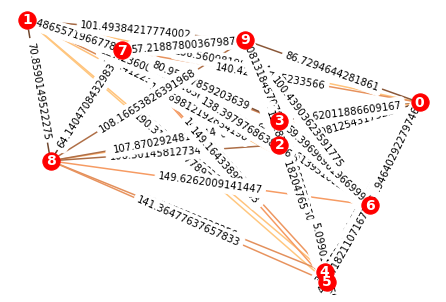

In [7]:
G = Graph(10,'Euclidean')
draw(G)

### Best path according to the ACO algorithm

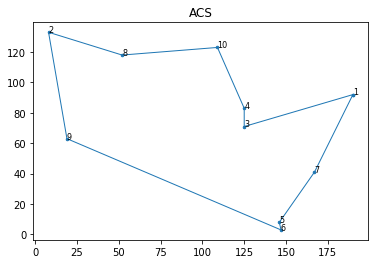

Distance travelled:  539.48


<Figure size 432x288 with 0 Axes>

In [8]:
ACOTSP = TravelSalesmanProblemWithACO( nodes= G.points) # Instantiate TravelSalesmanProblemWithACO passing the desired parameters
distance = ACOTSP.run() # Run the optimization
ACOTSP.plot()
print("Distance travelled: ",  distance)

## Test time and quality

In [9]:

def test_time_and_quality():
    timesForACO = [] # record all times for each graph using the ACO algorithm
    timesForGreedy = [] # record al times for each graph using the greedy algorithm
    costForGreedy = [] # record all costs for the greedy algorithm
    costForACO = [] # record all costs for the ACO algorithm
    graphPoints = [] # record number of points in a graph

    for i in range(3, 100):
        G = Graph(i,'Euclidean')

        acs = TravelSalesmanProblemWithACO( nodes= G.points) # Instantiate TravelSalesmanProblemWithACO passing the desired parameters
        t0ForACO = perf_counter() # Start timer for ACO
        distance = acs.run() # Run the optimization
        t1ForACO = perf_counter() # Finish timer for ACO
        timesForACO.append(t1ForACO - t0ForACO)
        costForACO.append(distance)

        graphPoints.append(i) # Append graph points

        t0 = perf_counter() # Start timer for Greedy Algorithm
        greedyVisited, greedyCost =  greedy_nearest_neighbour(G) # Run greedy solution now
        t1 = perf_counter() # Finish timer for Greedy Algorithm
        timesForGreedy.append(t1-t0)
        costForGreedy.append(greedyCost)
    return  timesForACO, costForACO, timesForGreedy, costForGreedy

# Uncommend code below to run function
# test_time_and_quality()

## Time comparasion between ACO and Greedy

In [10]:
# timesForGreedy = pd.DataFrame(timesForGreedy, columns =['Times'])
# timesForGreedy.to_csv("../ACO/timesForGreedy.csv")
timesForACO = pd.read_csv("../ACO/times_for_ACO.csv", index_col=0)
timesForGreedy = pd.read_csv("../ACO/timesForGreedy.csv", index_col=0)

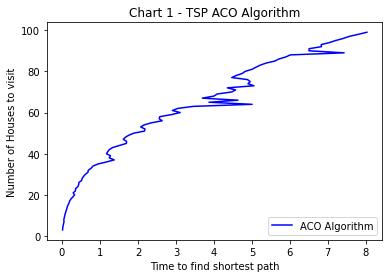

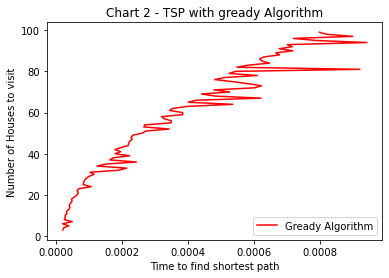

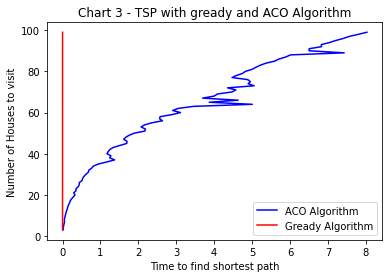

In [11]:
# Saved the number of cities to visit here. We only tested up to 99 cities to visit.
numberOfVerticesForEachCost = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]

plt.plot(timesForACO['Times'], numberOfVerticesForEachCost, 'b-', label="ACO Algorithm")
plt.legend(loc="lower right")
plt.ylabel("Number of Houses to visit")
plt.xlabel("Time to find shortest path")
plt.title("Chart 1 - TSP ACO Algorithm")
plt.show()

plt.plot(timesForGreedy["Times"], numberOfVerticesForEachCost, 'r-', label="Gready Algorithm")
plt.legend(loc="lower right")
plt.ylabel("Number of Houses to visit")
plt.xlabel("Time to find shortest path")
plt.title("Chart 2 - TSP with gready Algorithm")
plt.show()

plt.plot(timesForACO["Times"], numberOfVerticesForEachCost, 'b-', label="ACO Algorithm")
plt.plot(timesForGreedy["Times"], numberOfVerticesForEachCost, 'r-', label="Gready Algorithm")
plt.legend(loc="lower right")
plt.ylabel("Number of Houses to visit")
plt.xlabel("Time to find shortest path")
plt.title("Chart 3 - TSP with gready and ACO Algorithm")
plt.show()

The previous charts represent the time taken to find the shortest path on a graph (G) as the number of cities increases. The first two charts are the ACO and Greedy results respectively and the third one, is both of them together. We wanted to show both of them separately first because the time taken by the greedy algorithm is much faster and it is not as easy to analyse when both of the results are in the same chart.

## Comparison distance travelled by the algorithm ACO vs Greedy

In [12]:
# costForGreedy = pd.DataFrame(costForGreedy, columns =['Cost'])
# costForGreedy.to_csv("../ACO/costForGreedy.csv")
# costForACO = pd.DataFrame(costForACO, columns =['Cost'])
# costForACO.to_csv("../ACO/costForACO.csv")
costForACO = pd.read_csv("../ACO/costForACO.csv", index_col=0)
costForGreedy = pd.read_csv("../ACO/costForGreedy.csv", index_col=0)

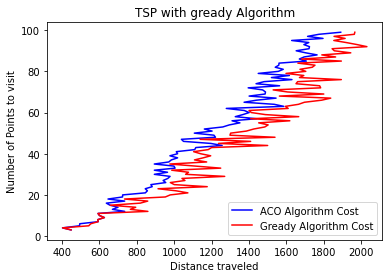

In [13]:
plt.plot(costForACO["Cost"], numberOfVerticesForEachCost, 'b-', label="ACO Algorithm Cost")
plt.plot(costForGreedy["Cost"], numberOfVerticesForEachCost, 'r-', label="Gready Algorithm Cost")
plt.legend(loc="lower right")
plt.ylabel("Number of Points to visit")
plt.xlabel("Distance traveled")
plt.title("TSP with gready Algorithm")
plt.show()

# Comparison of ACO algorithm against the Greedy Solution

By comparing the provided Greedy Algorithm against our chosen algorithm, which was the ACO Algorithm, we were able to reach the following deductions: 
* When the number of cities that the traveling man has to visit is between 0-20 (a small number), it is acceptable to use both algorithms. This because, the distance traveled is more or less similar in both cases.
* However, as the number of cities to visit surpasses 20+, the ACO Algorithm is always the best option to use, because the distance traveled is always guaranteed to be less when compared with the Greedy algorithm. It is also possible to verify that even that the ACO algorithm takes more time to come up with the shortest path to go through all the cities when compared with the Greedy algorithm, it compensates the extra time because the distance traveled is always shorter than the Greedy solution.


# Genetic Algorithm From Here


#### The GA Will Be Ran Repeatibly for N Generations Performing Steps in The Following Order:
1. Create population
2. Calculate fitness of route
3. Select a mating pool
4. Breed
5. Mutate to prevent local convergence

Each step mentioned above will be described in more detail above each relevant section of code below.

<br>

# Genetic Algorithm Pseudo code

Parameters: Set of randomly generated cities

Output: Optimal path, progress over time

1. **Begin**
2. $\quad$ **Create** initial population()
3. $\quad$ **for**(range of generations)
4. $\quad$ $\quad$ **for**(each population)
2. $\quad$ $\quad$ $\quad$ rank_individuals_by_fitness();
3. $\quad$ $\quad$ $\quad$ selection(fitness proportionate selection);
3. $\quad$ $\quad$ $\quad$ ordered crossover();
4. $\quad$ $\quad$ $\quad$ #mutation
5. $\quad$ $\quad$ $\quad$ **if**(two individuals are similar)
6. $\quad$ $\quad$ $\quad$ $\quad$ mutate()
7. $\quad$ $\quad$ $\quad$ **end**
8. $\quad$ $\quad$ **end**
9. $\quad$ **end**
10. **End**
            
# Big O analysis

On the average scenario, based in results plotted for the execution times against the number of cities, the complexity of the algorithm will be O(nLogn) due to the selection method implemented(Fitness proportionate Selection) which makes use of a randomly generated variable to determine wheather a specific route is selected to be part of the next population. 
Whereas, for a worst case scenarion, the complexity of the algorithm can go up to O(n^2) 

## Approach

In order to follow along with this section of the notebook, the following definitions will be used.

- Gene: Represents a city
- Individual (chromosome): &ensp; Single route satisfying condition
- Population: &ensp; Collection of possible routes I.E. individuals.
- Parents: &ensp; Two or more routes combined together into a new route
- Mating Pool: &ensp; A collection of parents
- Fitness: &ensp; Quality of a route in terms of distance
- Mutation: &ensp; Variation introduced to prevent local convergence by adding variation to the population through random swaps of cities for a given route.
- Elitism: &ensp; Persist best performing individuals through the next generation.

## What We Will Try to Acheive
Below, results are used to compare and contrast a variety of different aspects of a GA including calculating the run time complexity, viewing how alterations to the configuration of the GA affect run time and performance of GA when finding the most optimal route (within scope - may not be the overall optimal route)

We Then compare results from the Genetic Algorithm Approach with the Greedy Approach before finally comparing against the Ant Colonisation Approach to conclude this notebook with a full comparative analyse of all 3 approaches.

# Classes and Functions

## City Class and City List Generator Function
Create a class to represent an instance of a Gene (city) which has properties x and y to determine its location in 2D space and it's distance from another Gene.

In [14]:
class Gene:
    """City class with attributes x and y coordinates"""
    def __init__(self, x,y):
        self.x = x
        self.y = y
    
    def calcDistance(self, newGene):
        """
        Calcuate distance using pythagorean theorem agfains another gene
        
        :param newGene: (object) gene object   
        :return cartesianDistance: (int) distance between current city and another
        """
        xAxis = abs(self.x - newGene.x)
        yAxis = abs(self.y - newGene.y)
        cartesianDistance = np.sqrt(pow(xAxis, 2) + pow(yAxis,2))
        return cartesianDistance

    def __repr__(self):
        """Cleaner way to represent city"""
        return f"({self.x}, {self.y})"

### Method to generate a random list of N Genes (cities)

In [15]:
def city_list(number_of_cities):
    """
    Create list of random cities
    
    :param number_of_cities: (int) number of cities to make 
    :return city_list: (list) list of cities
    """
    city_list = []
    for i in range(number_of_cities):
        city_list.append(Gene(x=int(random.random() * 200), y=int(random.random() * 200)))
    return city_list

## Fitness Class

Class and methods to calculate a fitness for a given route within a generation

The below implementation of fitness takes the inverse of the route distance to attempt to minimise distance resulting in a larger fitness score.

In [16]:
class Fitness:
    """Fitness class to determine the fitness of a given route"""
    def __init__(self, individual):
        self.individual = individual
        self.distance = 0
        self.fitness = 0.0
    
    def calcIndividualDistance(self):
        """
        Calculate route distance
        
        :return self.distance: (int) route distance
        """
        if self.distance == 0:
            partialDistance = 0
            for i in range(0, len(self.individual)):
                startIndividual = self.individual[i]
                finishIndividual = None
                if i+1 < len(self.individual):    # Taking into account starting and finishing at the same city
                    finishIndividual = self.individual[i+1]
                else:
                    finishIndividual = self.individual[0]
                partialDistance = partialDistance + startIndividual.calcDistance(finishIndividual)
                self.distance = partialDistance
        return self.distance

    def calcIndivivualFitness(self):
        """
        Calculate fitness - larger fitness means a yeild of better results
        
        :return self.fitness: (float) route fitness
        """
        if self.fitness == 0:
            self.fitness = 1 / float(self.calcIndividualDistance())
        return self.fitness

# Create starting population

&ensp;

## Create Route
Generate route/population by randomly selecting order to visit each city.

In [17]:
def createIndividual(geneList):
    """
    Create initial route from random sample of cities matching lenght of number of cities
    
    :param geneList: (list) list of cities
    :return individual: (list)
    """
    individual = random.sample(geneList, len(geneList))
    return individual

## Initial Population
Create initial population (list of routes the size of chosen population) - Need only be ran once to create initial population. Subsequent generations created through breeding and mutation

In [18]:
def buildPopulation(size, geneList):
    """
    Create initial population
    
    :param size: (int) population size
    :param geneList: (list) list of cities
    :return populationSet: (list) population - list of routes the size of the population
    """
    populationSet = [createIndividual(geneList) for i in range(size)]
    return populationSet

## Create genetic algorithm

&ensp;

### Create Route Rank
Rank individuals to simulate survival of the fittest, using fitness to rank each individual in the population. 
Output will be an ordered list with route IDs and fitness scores

In [19]:
def rankIndividuals(population):
    """
    Rank individuals(routes) within population by fitness to simulate survival of the fittest
    
    :param population: (list) list of routes
    :return results: (list) ordered list of route IDs and associated fitness
    """
    results= {}
    for i in range(len(population)):
        results[i] = Fitness(population[i]).calcIndivivualFitness() 
    return sorted(results.items(), key = operator.itemgetter(1), reverse = True)

### Selection and Mating
The mating pool selection process to breed two parents for the next generation can be attempted following two different approaches:
- Fitness Proportionate Selection (roulette wheel selection)
- Tournament Selection

<br>

### Fitness Proportionate Selection (Roulette Wheel Selection)
Version implemented below to determine fitness for each individual relative to the population used to assign a probability of selection. Essentially fitness-weighted probability of being selected.

<br>

### Tournemant Selection
A set number of individuals randomly selected from population. Individuals with the highest fitness in group are chosen as the first parent. Process then repeated to choose second parent.
Please Note - This implementation has not been attempted within this notebook.

<br>

### Design feature consideration - Elitism
Elitism is not necessary but may result in a lower computational cost.
The best performing individuals from the population will automatically carry over to the next generation, ensuring most successful individuals persist.


In [20]:
def selection(popRanked, eliteSize):
    """
    Lines 6-8 setup roulette wheel by calculationg relative fitness weight for each individual
    
    :param popRanked: (list) list of ranked populations
    :param eliteSize: (int) number or elites to be carried over
        
    :return selectionResults (list) list of routes to select in selection process. 
    """
    selectionResults = []
    df = pd.DataFrame(np.array(popRanked), columns=["Index","Fitness"])
    df['cum_sum'] = df.Fitness.cumsum()
    df['cum_perc'] = 100*df.cum_sum/df.Fitness.sum()
    
    for i in range(eliteSize):  # returns list of route IDs to create mating pool in buildMatingPool func
        selectionResults.append(popRanked[i][0])
    for i in range(len(popRanked) - eliteSize):  # returns list of route IDs to create mating pool in buildMatingPool func
        pick = 100*random.random()
        for i in range(len(popRanked)):
            if pick <= df.iat[i,3]:
                selectionResults.append(popRanked[i][0])
                break
    return selectionResults

## Mating
Create mating pool by extracting the selected individuals from population.

In [21]:
def buildMatingPool(population, selectionResults):
    """
    Extract selected individuals for mating
    
    :param population:(list) list of routes
    :param selectionResults: (list) selected individuals
    :return pool: (list) list selected individuals for mating
    """
    pool = []
    length = len(selectionResults)
    for i in range(length):
        index = selectionResults[i]
        pool.append(population[index])
    return pool

## Breed - Ordered Crossover
Create a crossover function for two parents to create one child.

Create next generation using ordered crossover (breeding) from mating pool.

Ordered crossover is used to ensure that all locations are included exactly once to abide by TSP criteria.

Ordered crossover is achieved by randomly selecting a subset of the first parent and filling in the remainder of the routes with the second parent in the order which they appear without duplication of genes.


In [22]:
def breed(parent1, parent2):
    """
    Use ordered crossover to create child
    
    :param parent1: (list)
    :param parent2: (list)
    :return child: (list1)
    """
    childP1, childP2 = [], []
    
    geneA = int(random.random() * len(parent1))
    geneB = int(random.random() * len(parent1))
    startGene = min(geneA, geneB)
    endGene = max(geneA, geneB)

    for i in range(startGene, endGene):
        childP1.append(parent1[i])
        
    childP2 = [item for item in parent2 if item not in childP1]
    child = childP1 + childP2
    return child

In order to generalise for the creation of new offspring, elitism is now implemented to persist the best performing genes within the population before breeding takes place

In [23]:
def breedPopulation(matingpool, eliteSize):
    """
    Create crossover of full mating pool
    
    :param matingpool: (list)
    :param eliteSize: (int)
    :return children: (list)
    """
    children = []
    length = len(matingpool) - eliteSize
    pool = random.sample(matingpool, len(matingpool))

    for i in range(0,eliteSize):
        children.append(matingpool[i])
    
    for i in range(0, length):
        child = breed(pool[i], pool[len(matingpool)-i-1])
        children.append(child)
    return children

## Mutation

Create function to mutate a single route

Mutation is used to add variance which acts as a preventative measure in avoiding local convergence to allow the GA to explore other parts of the solution space.

Because cities can't be dropped as part of the TSP, similarly to crossover, a unique approach must be taken when implementing mutation. As such, the below implementation utilises swapping to act as variance where one city is swapped randomly with another.

The amount of mutation is specified by a percentage which for most of the below results is set to 1%.

&ensp;

Mutation will be performed for one individual in the mutate function.

1. **Begin**
2. $\quad$ **for**(range of a population)
3. $\quad$ $\quad$ **for**(each individual)
4. $\quad$ $\quad$ $\quad$ **if** (below mutation rate)
2. $\quad$ $\quad$ $\quad$ $\quad$ swapp two random cities()
4. $\quad$ $\quad$ $\quad$ **end**
4. $\quad$ $\quad$ **end**
7. $\quad$ **end**
8. **End**
    

In [24]:
def mutate(individual, mutationRate):
    """ 
    Mutate paths within solution space to avoid local convergance
    
    :param individual: (list)
    :param mutationRate: (float) percentage of mutation
    :return individual: (list)
    """
    for swapped in range(len(individual)):
        if(random.random() < mutationRate):
            swapWith = int(random.random() * len(individual))
            
            city1 = individual[swapped]
            city2 = individual[swapWith]
            
            individual[swapped] = city2
            individual[swapWith] = city1
    return individual

Create function to run mutation over entire population

In [25]:
def mutatePopulation(population, mutationRate):
    """
    Mutate new population
    
    :param population: (list)
    :param mutationRate: (float)percentage or mutation
    :return mutatedPop: (list)
    """
    mutatedPop = []
    
    for individual in range(len(population)):
        mutatedInd = mutate(population[individual], mutationRate)
        mutatedPop.append(mutatedInd)
    return mutatedPop

## Create next Generation

&ensp;

Put all steps together to create the next generation.

This function produces a new generation using the rankRoutes before determining the potential parents by running the selection function.

Finally, a new generation is crated using the breedPopulation function, applying mutation using the mutatePopulation function.

The above steps are executed repeatedly for N generations within the geneticAlgorithm function.

In [26]:
def nextGeneration(currentGen, eliteSize, mutationRate):
    """
    Create next generation
    
    :param currentGen: (list)
    :param eliteSize: (int)
    :param mutationRate: (float)
    :return nextGeneration: (list)
    """
    popRanked = rankIndividuals(currentGen)
    selectionResults = selection(popRanked, eliteSize)
    matingPool = buildMatingPool(currentGen, selectionResults)
    children = breedPopulation(matingPool, eliteSize)
    nextGeneration = mutatePopulation(children, mutationRate)
    return nextGeneration

## Genetic Algorithm
Final step: create the genetic algorithm

&ensp;

### Evolution in motion
Now that all aspects of the GA have been created above, all that is left is the process of creating the initial population and looping through N generations.

We also want to see the best route and how much we've improved, so we capture the initial distance, the final distance and the best route. (Execution times are also gathered which can be viewed in the `simulate.py` script in the base of this repository)

In [27]:
def geneticAlgorithm(population, popSize, eliteSize, mutationRate, generations):
    """ 
    Find most opimal route
    
    :param population: (list)
    :param popSize: (int)
    :param eliteSize: (int)
    :param mutationRate: (float)
    :param generation: (int)
    :return bestRoute progress: (list, list)
    """
    progress = []
    pop = buildPopulation(popSize, population)
    print("Initial distance: " + str(1 / rankIndividuals(pop)[0][1]))
    
    for i in range(0, generations):
        pop = nextGeneration(pop, eliteSize, mutationRate)
        progress.append(1 / rankIndividuals(pop)[0][1])
    
    print("Final distance: " + str(1 / rankIndividuals(pop)[0][1]))
    bestRouteIndex = rankIndividuals(pop)[0][0]
    bestRoute = pop[bestRouteIndex]
    return bestRoute, progress

## Running the genetic algorithm
Create list of cities

Below, we can now solve the TSP in two steps:
 - Create a list of cities to travel between. - So in this example, 10 cities, let along 25 cities random cities may seem like a small number, however a brute force approach would result in 362,880 possible routes.
 - Run the genetic algorithm - in our example, we use 100 individuals in each generation, keep 20 elite individuals, use a 1% mutation rate for a given gene, and run through 500 generations

 &ensp;
 
All results below were generated by `simulate.py` found in the base of this repository where results have been stored in csv files. Each simulation generates the following csv files within a specified directory
- Progress
    - index (generation)
    - Distance 
    - Time (executon time to compute generation)
- route
    - index
    - city_from
    - city_to
- total_time
    - index
    - population
    - execution_time (total execution time)

Because data is loaded from csv files, runtime for this section of the notebook is negligible.

## How to Create a List of Cities and Run GA

Please use the below code if you wish to run a simulation within this notebook:
```
geneList = city_list(10)
route, progress = geneticAlgorithm(population=geneList, popSize=100, eliteSize=20, mutationRate=0.01, generations=500)

column_names = ["city_from", "city_to"]
cities = pd.DataFrame(columns = column_names)

mydict, tour = routetodict(route, cities)
tour

#creating graph object from NetworkX
tour_graph = create_networkx_graph(tour)
pos=nx.get_node_attributes(tour_graph,'pos')

```

## Visualise Optimal Route

In [28]:
def routetodict(route, dataframe):
    """Place a route inside a dictionary and pandas dataframe
    
    :param route: (list of cities)
    :return routes_dict dataframe: (dict, pandas dataframe) dictionary of routes and dictrionary of routes stored as tuples 
    """
    routes_dict = {}
    city_index = 0
    
    for index in route:
        routes_dict[city_index] = (index.x, index.y)
        
        dataframe.loc[city_index] = [index.x, index.y]
        city_index += 1
    
    return routes_dict, dataframe

In [29]:
def create_networkx_graph(tour):
    """Create a netowkrx graph from dataframe
    
    Paramters: 
        tour (pandas dataframe) Dataframe containing ordered cities/tour
    
    Returns:
        tour_graph (object) Networkx Graph Object
    """
    tour_graph = nx.Graph()
    
    for index, row in tour.iterrows():
        tour_graph.add_node(index, pos=(row["city_from"], row["city_to"]))
        
    for index in range(len(tour_graph.nodes)):
        if index == len(tour_graph.nodes) - 1:
            tour_graph.add_edge(index, 0)
        else:
            tour_graph.add_edge(index, index+1)
            
    return tour_graph

## Plotly Graph from tour dataframe

In [30]:
def create_route_graph(tour_graph):
    G = tour_graph
    edge_x = []
    edge_y = []
    lables = []
    lablepos_x = []
    lablepos_y = []
    for edge in G.edges():
        x0, y0 = G.nodes[edge[0]]['pos']
        x1, y1 = G.nodes[edge[1]]['pos']
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)
        tempDistance = round(math.sqrt(((x1-x0)**2) + ((y1-y0)**2)),2)
        lables.append(f'{tempDistance}')
        lablepos_x.append((x1+x0)/2)
        lablepos_y.append((y1+y0)/2)

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        text=lables,
        name='Route',
        hoverinfo='text',
        mode='lines')

    node_x = []
    node_y = []
    for node in G.nodes():
        x, y = G.nodes[node]['pos']
        node_x.append(x)
        node_y.append(y)

    trace_text = go.Scatter(
        x=lablepos_x, y=lablepos_y, 
        mode='text',
        name='Distance',
        text=lables,
        textposition='middle center', hoverinfo='text',
        hovertemplate = "Distance: %{text}")
    

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers',
        text=['x: {edge_x}; y:{edge_y}'],
        hoverinfo='x+y',
        hovertemplate="Location: <br> x axis: %{x} <br> y axis %{y}",
        name='Genes',
        marker=dict(
            colorscale='YlGnBu',
            reversescale=True,
            color=[],
            size=10,
            line_width=2))

    node_adjacencies = []
    node_text = []
    for node, adjacencies in enumerate(G.adjacency()):
        node_adjacencies.append(len(adjacencies[1]))
        node_text.append('# of connections: '+str(len(adjacencies[1])))

    node_trace.marker.color = node_adjacencies
    edge_trace.text = lables
    
    return edge_trace, node_trace, trace_text


In [31]:
def plot_graph(edge_trace, node_trace, trace_text, title_name):
    fig = go.Figure(data=[edge_trace, node_trace,trace_text],
                 layout=go.Layout(
                    hovermode='closest',
                    title=title_name,
                    margin=dict(b=20,l=5,r=5,t=100),
                    xaxis=dict(showgrid=False, zeroline=True, showticklabels=True),
                    yaxis=dict(showgrid=False, zeroline=True, showticklabels=True),
                    legend=dict(title='legend'))
                    )
    fig.update_xaxes(title_text='X axis')
    fig.update_yaxes(title_text='y axis')
    fig.show()

# Load CSV information

In [32]:
def read_list_of_files_into_Dataframes(list_of_files, relative_directory, city_directory_convention, filename_convention1, filename_convention2, file_name, file_extension, number_or_runs):
    """Read a list csv files into a dictioary of dataframes"""
    progress_data_dictionary = {}
    for city_count in list_of_files:
        progress_data_dictionary[f"{city_count}_cities"] = {}
        for run_number in range(number_or_runs):
            dataframe = pd.read_csv(f"{relative_directory}/{city_count}{city_directory_convention}/run_{run_number+1}/{filename_convention1}{city_count}{filename_convention2}{file_name}.{file_extension}", index_col=0)
#             key = f"{city_count}{city_directory_convention}"
#             print(f"KEY: {key}")
            progress_data_dictionary[f"{city_count}_cities"][f"run_{run_number+1}"] = dataframe
#             progress_data_dictionary[key][f"run_{run_number+1}"] = dataframe # this breaks on generations for some unkown reason
    return progress_data_dictionary

In [33]:
def merge_dataframes(dataframe_1, dataframe_2, dataframe_3, column_naming_convention):
    """
    Merge a list of execution time dataframes for a given simulation
    :param dataframe_1: (dataframe)
    :param dataframe_2: (dataframe)
    :param dataframe_3: (dataframe) 
    :return new_dataframe: (dataframe) merged_dataframe
    """
    new_dataframe = dataframe_1
    new_dataframe[f"{column_naming_convention}_2"] = dataframe_2[f"{column_naming_convention}"]
    new_dataframe[f"{column_naming_convention}_3"] = dataframe_3[f"{column_naming_convention}"]
    return new_dataframe


def calculate_min_max_average_times(merged_dataframe, column_naming_convention):
    """
    Return a new dataframe which contianing calucated min, max and average execution times
    :param merged_dataframe: (dataframe)
    :return merged_dataframe: (dataframe) Modified dataframe including min, max and mean execution_times
    """
    merged_dataframe[f'Max_{column_naming_convention}'] = merged_dataframe[[f"{column_naming_convention}", f"{column_naming_convention}_2"]].max(axis=1) # Maximum Time
    merged_dataframe[f'Min_{column_naming_convention}'] = merged_dataframe[[f"{column_naming_convention}", f"{column_naming_convention}_2"]].min(axis=1) # Minimum Time
    merged_dataframe[f'Mean_{column_naming_convention}'] = merged_dataframe[[f"{column_naming_convention}", f"{column_naming_convention}_2"]].mean(axis=1) # Calculate Mean Time
    
    return merged_dataframe


def process_dataframes(progress_dataframe_dict, list_of_cities, number_or_runs_list, column_naming_convention):
    """
    Process dictionary of dataframes and produced merged concatenation with additional time metadata
    
    :param progress_dataframe_dict: (dict) dictionary of preprocessed dataframes
    :param list_of_cities: (list) list of cities numbers to read merge contents of
    :param number_or_runs_list: (list) simulation run instances to calculate mean, min and max from
    :param column_naming_convention: (str) naming convention of columns containing time information to merge
    :return processed_data_dictionary (dict) dictionary of proccessed dataframes ready for visualisation
    """
    processed_data_dictionary = {}
    for city_count in list_of_cities:
        dataframe = calculate_min_max_average_times(merge_dataframes(progress_dataframe_dict[f"{city_count}_cities"][f"run_{number_or_runs_list[0]}"], 
                                                                     progress_dataframe_dict[f"{city_count}_cities"][f"run_{number_or_runs_list[1]}"],
                                                                     progress_dataframe_dict[f"{city_count}_cities"][f"run_{number_or_runs_list[2]}"],
                                                                     column_naming_convention), column_naming_convention)
        processed_data_dictionary[f"{city_count}_cities"] = dataframe
    return processed_data_dictionary

## Cities 25 - 3000

Loading Data from CSV files and applying minor data handling techniques to data within Pandas Dataframes to be used for analytical purposes

In [34]:
# # //////////////////////////////// -_| Progress Cities |_- \\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\ 
run_merge = 2 # number of iterative runs to merge into one df
RELATIVE_DIRECTOERY = "../cities"
CITY_DIR_CONVENTION = "_cities"
FILENAME_CONVENTION_1_of_2 = "GA_TSP_"
FILENAME_CONVENTION_2_of_2 = "city_100popsize_20elite_001mut_500gen_"
FILE_TYPE = "csv"
number_or_runs = 3
file_name_time = "total_time"
file_name_progress = "progress"
file_name_route = "route"
cities_directory_list = ['25', '30', '50', '100', '150', '200', '250', '300', '400', '500', '600', '700', '800', '900', '1000', '1100', '1200', '1300', '1400', '1500', '1600', '1700', '1800', '1900', '2000', '2100', '2200', '2300', '2400', '2500', '2600', '2700', '2800', '2900', '3000'] # files by city count ot read into dfs

execution_times_dataframe_dict = read_list_of_files_into_Dataframes(cities_directory_list, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_time, FILE_TYPE, number_or_runs)
progress_dataframe_dict = read_list_of_files_into_Dataframes(cities_directory_list, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_progress, FILE_TYPE, number_or_runs)
route_times_dataframe_dict = read_list_of_files_into_Dataframes(cities_directory_list, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_route, FILE_TYPE, number_or_runs)

# Total Execution Times Cities
execution_times_dataframe_df_3000 = calculate_min_max_average_times(merge_dataframes(execution_times_dataframe_dict["3000_cities"]["run_1"],
                                                                                     execution_times_dataframe_dict["3000_cities"]["run_2"],
                                                                                     execution_times_dataframe_dict["3000_cities"]["run_3"],
                                                                                     'execution_time'), 'execution_time')

# Processed Progress Dataframes for Visualisation
process_dataframes(progress_dataframe_dict, cities_directory_list, [1, 2, 3],'Time')
progress = process_dataframes(progress_dataframe_dict, cities_directory_list, [1, 2, 3],'Distance')

display(execution_times_dataframe_df_3000.head())
display(progress['100_cities'].head())
display(route_times_dataframe_dict['30_cities']['run_1'].head())

,population,execution_time,execution_time_2,execution_time_3,Max_execution_time,Min_execution_time,Mean_execution_time
0,25,76,75,75,75,75,75.0
1,30,77,78,78,78,78,78.0
2,50,88,89,89,89,89,89.0
3,100,112,116,116,116,116,116.0
4,150,130,134,134,134,134,134.0


,Distance,Time,Time_2,Time_3,Max_Time,Min_Time,Mean_Time,Distance_2,Distance_3,Max_Distance,Min_Distance,Mean_Distance
0,8724.762550,0.222919,0.248725,0.228556,0.248725,0.222919,0.235822,9339.948333,9272.254160,9339.948333,8724.762550,9032.355442
1,8546.659868,0.228483,0.258240,0.225345,0.258240,0.228483,0.243362,9020.786210,9052.858377,9020.786210,8546.659868,8783.723039
2,8509.196959,0.218513,0.288019,0.222885,0.288019,0.218513,0.253266,9076.753435,9052.858377,9076.753435,8509.196959,8792.975197
3,8230.903010,0.457861,0.281125,0.213528,0.457861,0.281125,0.369493,9017.523144,8915.628002,9017.523144,8230.903010,8624.213077
4,8207.765974,0.464626,0.229319,0.219722,0.464626,0.229319,0.346973,9006.455215,8988.314947,9006.455215,8207.765974,8607.110594


,city_from,city_to
0,53,166
1,55,156
2,81,174
3,73,184
4,101,194


## Generations
Loading Data from CSV files and applying minor data handling techniques to data within Pandas Dataframes to be used for analytical purposes

In [35]:
RELATIVE_DIRECTOERY = "../generations"
CITY_DIR_CONVENTION = "_gens"
FILENAME_CONVENTION_1_of_2 = "GA_TSP_500city_100popsize_20elite_001mut_"
FILENAME_CONVENTION_2_of_2 = "gen_"
number_or_runs = 3
generations_directory_list = ['500', '600', '700', '800', '900', '1000', '1100', '1200', '1300', '1400', '1500'] # files by generation count ot read into dfs

generations_progressed_dict = read_list_of_files_into_Dataframes(generations_directory_list, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_progress, FILE_TYPE, number_or_runs)
execution_times_dataframe_dict_generations = read_list_of_files_into_Dataframes(generations_directory_list, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_time, FILE_TYPE, number_or_runs)
route_generation_dataframe_dict = read_list_of_files_into_Dataframes(generations_directory_list, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_route, FILE_TYPE, number_or_runs)

# Total Execution Times Generations
execution_dataframe_df_generations = calculate_min_max_average_times(merge_dataframes(execution_times_dataframe_dict_generations["1500_cities"]["run_1"],
                                                                                      execution_times_dataframe_dict_generations["1500_cities"]["run_2"],
                                                                                      execution_times_dataframe_dict_generations["1500_cities"]["run_3"],
                                                                                      'execution_time'), 'execution_time')

# Processed Progress Dataframes for Visualisation
process_dataframes(generations_progressed_dict, generations_directory_list, [1, 2, 3], 'Time')
generations_progress = process_dataframes(generations_progressed_dict, generations_directory_list, [1, 2, 3], 'Distance')

display(execution_dataframe_df_generations.head())
display(generations_progress['1500_cities'].head())
display(route_generation_dataframe_dict['500_cities']['run_1'].head())

,population,execution_time,execution_time_2,execution_time_3,Max_execution_time,Min_execution_time,Mean_execution_time
0,500,307,303,301,307,303,305.0
1,500,370,363,363,370,363,366.5
2,500,434,418,428,434,418,426.0
3,500,492,479,483,492,479,485.5
4,500,558,541,547,558,541,549.5


,Distance,Time,Time_2,Time_3,Max_Time,Min_Time,Mean_Time,Distance_2,Distance_3,Max_Distance,Min_Distance,Mean_Distance
0,48976.674623,0.598737,0.599782,0.577109,0.599782,0.598737,0.599260,48976.674623,49012.906358,48976.674623,48976.674623,48976.674623
1,48719.796498,0.591645,0.652357,0.593334,0.652357,0.591645,0.622001,48719.796498,48979.142437,48719.796498,48719.796498,48719.796498
2,48201.303030,0.627895,0.577085,0.593649,0.627895,0.577085,0.602490,48201.303030,48322.683619,48201.303030,48201.303030,48201.303030
3,47630.947744,0.632990,0.584224,0.586419,0.632990,0.584224,0.608607,47630.947744,48369.037622,47630.947744,47630.947744,47630.947744
4,47013.084043,0.590230,0.581330,0.576953,0.590230,0.581330,0.585780,47013.084043,48021.570152,47013.084043,47013.084043,47013.084043


,city_from,city_to
0,40,150
1,193,37
2,118,92
3,37,184
4,157,182


## Mutations
Loading Data from CSV files and applying minor data handling techniques to data within Pandas Dataframes to be used for analytical purposes

In [36]:
mutations_directory_list = ['001', '0015', '0025', '005', '0075', '010',  '020']
RELATIVE_DIRECTOERY = "../mutation"
CITY_DIR_CONVENTION = "_mutation"
FILENAME_CONVENTION_1_of_2 = "GA_TSP_100city_100popsize_20elite_"
FILENAME_CONVENTION_2_of_2 = "mut_500gen_"
number_or_runs = 3
mutations_progressed_dict = read_list_of_files_into_Dataframes(mutations_directory_list, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_progress, FILE_TYPE, number_or_runs)

process_dataframes(mutations_progressed_dict, mutations_directory_list, [1, 2, 3], 'Time')
mutations_progress = process_dataframes(mutations_progressed_dict, mutations_directory_list, [1, 2, 3], 'Distance')

# display(mutations_progressed_dict['020_cities']["run_1"].head())
display(mutations_progress['020_cities'].head())

,Distance,Time,Time_2,Time_3,Max_Time,Min_Time,Mean_Time,Distance_2,Distance_3,Max_Distance,Min_Distance,Mean_Distance
0,9538.167891,0.206420,0.219738,0.219543,0.219738,0.206420,0.213079,8829.348697,9143.041120,9538.167891,8829.348697,9183.758294
1,9646.293096,0.210105,0.216012,0.229698,0.216012,0.210105,0.213059,8985.887489,9422.929333,9646.293096,8985.887489,9316.090292
2,9622.380207,0.229310,0.223971,0.242480,0.229310,0.223971,0.226641,9215.149351,9208.158152,9622.380207,9215.149351,9418.764779
3,9538.715793,0.218092,0.227932,0.233572,0.227932,0.218092,0.223012,9186.693266,9218.910947,9538.715793,9186.693266,9362.704529
4,9309.386990,0.206073,0.222869,0.215649,0.222869,0.206073,0.214471,9015.785172,9087.298522,9309.386990,9015.785172,9162.586081


## Cities 3 - 99
Loading Data from CSV files and applying minor data handling techniques to data within Pandas Dataframes to be used for analytical purposes

In [37]:
run_merge = 2 # number of iterative runs to merge into one df
RELATIVE_DIRECTOERY = "../comparison_3-99"
CITY_DIR_CONVENTION = "_cities"
FILENAME_CONVENTION_1_of_2 = "GA_TSP_"
FILENAME_CONVENTION_2_of_2 = "city_100popsize_10elite_001mut_250gen_"
FILE_TYPE = "csv"
number_or_runs = 3
file_name_time = "total_time"
file_name_progress = "progress"
file_name_route = "route"
cities_directory_list_99 = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99] # files by city count ot read into dfs

execution_times_dataframe_dict_99 = read_list_of_files_into_Dataframes(cities_directory_list_99, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_time, FILE_TYPE, number_or_runs)
progress_dataframe_dict_99 = read_list_of_files_into_Dataframes(cities_directory_list_99, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_progress, FILE_TYPE, number_or_runs)
route_times_dataframe_dict_99 = read_list_of_files_into_Dataframes(cities_directory_list_99, RELATIVE_DIRECTOERY, CITY_DIR_CONVENTION, FILENAME_CONVENTION_1_of_2, FILENAME_CONVENTION_2_of_2, file_name_route, FILE_TYPE, number_or_runs)

# Total Execution Times Cities
execution_times_dataframe_df_99 = calculate_min_max_average_times(merge_dataframes(execution_times_dataframe_dict_99["99_cities"]["run_1"],
                                                                                     execution_times_dataframe_dict_99["99_cities"]["run_2"],
                                                                                     execution_times_dataframe_dict_99["99_cities"]["run_3"],
                                                                                     'execution_time'), 'execution_time')

# Processed Progress Dataframes for Visualisation
process_dataframes(progress_dataframe_dict_99, cities_directory_list_99, [1, 2, 3],'Time')
progress_99 = process_dataframes(progress_dataframe_dict_99, cities_directory_list_99, [1, 2, 3],'Distance')

display(execution_times_dataframe_df_99)
display(progress_99['99_cities'].head())
display(route_times_dataframe_dict_99['30_cities']['run_1'].head())

,population,execution_time,execution_time_2,execution_time_3,Max_execution_time,Min_execution_time,Mean_execution_time
0,3,45,46,46,46,45,45.5
1,4,44,45,44,45,44,44.5
2,5,40,43,42,43,40,41.5
3,6,41,42,43,42,41,41.5
4,7,40,40,43,40,40,40.0
...,...,...,...,...,...,...,...
92,95,62,64,64,64,62,63.0
93,96,64,61,61,64,61,62.5
94,97,63,63,64,63,63,63.0
95,98,64,62,62,64,62,63.0


,Distance,Time,Time_2,Time_3,Max_Time,Min_Time,Mean_Time,Distance_2,Distance_3,Max_Distance,Min_Distance,Mean_Distance
0,9559.388914,0.254824,0.235654,0.238106,0.254824,0.235654,0.245239,8508.953952,9445.792239,9559.388914,8508.953952,9034.171433
1,9411.035890,0.224081,0.240944,0.238494,0.240944,0.224081,0.232513,8081.786237,9130.606736,9411.035890,8081.786237,8746.411064
2,9302.366485,0.242372,0.238827,0.248232,0.242372,0.238827,0.240599,7841.242384,9157.816945,9302.366485,7841.242384,8571.804434
3,9281.429390,0.263309,0.225862,0.228227,0.263309,0.225862,0.244586,7959.629633,9031.055410,9281.429390,7959.629633,8620.529512
4,9163.764343,0.253997,0.249562,0.244857,0.253997,0.249562,0.251780,8011.204154,8887.530707,9163.764343,8011.204154,8587.484249


,city_from,city_to
0,94,1
1,121,36
2,98,30
3,115,14
4,95,16


## Graph

# Read Route from CSV for 30 Cities, 100 Population Size, 20 Elites, 1% Mutation and 500 Generations and Display as Graph

In [38]:
tour_graph_30 = create_networkx_graph(route_times_dataframe_dict['30_cities']['run_1'])
pos_30=nx.get_node_attributes(tour_graph_30,'pos')

### View Raw Data

In [39]:
pos_30 # View Poistions of graph

{0: (53, 166),
 1: (55, 156),
 2: (81, 174),
 3: (73, 184),
 4: (101, 194),
 5: (117, 198),
 6: (147, 190),
 7: (159, 151),
 8: (185, 118),
 9: (191, 112),
 10: (167, 119),
 11: (121, 135),
 12: (84, 131),
 13: (109, 116),
 14: (105, 94),
 15: (68, 80),
 16: (85, 64),
 17: (81, 30),
 18: (121, 10),
 19: (185, 19),
 20: (182, 20),
 21: (77, 26),
 22: (59, 22),
 23: (60, 9),
 24: (6, 10),
 25: (3, 41),
 26: (2, 46),
 27: (0, 69),
 28: (20, 91),
 29: (17, 168)}

## Plot Graph of Most Optimal Route for 30 Cities

In [40]:
edge_trace, node_trace, trace_text = create_route_graph(tour_graph_30)  # Create traces for visualisation
plot_graph(edge_trace, node_trace, trace_text, 'Optimal Route for 30 Cities, 100 Population Size, 20 Elites, 1% Mutation and 500 Generations')  # Visualise

# Static Image Representation of Visualisation

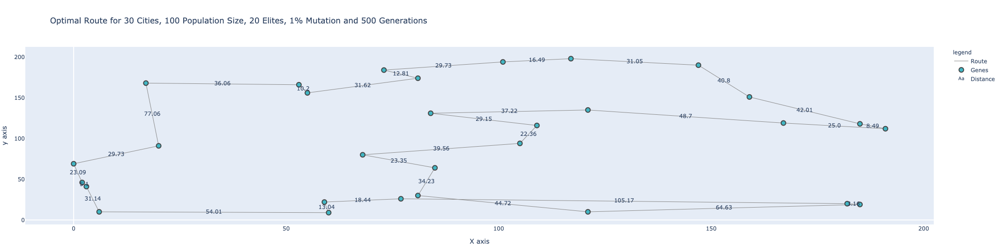

In [41]:
display(Image(filename = "../Images/Optimal_Route_for_30_Cities_100_Population_Size_20 Elites_001_Mutation_and_500_Generations.png"))

## Read Route from CSV for 2000 Cities, 100 Population Size, 20 Elites, 1% Mutation and 500 Generations and Display as Graph

In [42]:
tour_graph_2000 = create_networkx_graph(route_times_dataframe_dict['2000_cities']['run_1'])
pos_1000=nx.get_node_attributes(tour_graph_2000,'pos')

edge_trace, node_trace, trace_text = create_route_graph(tour_graph_2000)  # Create traces for visualisation
plot_graph(edge_trace, node_trace, trace_text, 'Optimal Route for 2000 Cities, 100 Population Size, 20 Elites, 1% Mutation and 500 Generations')  # Visualise

# Static Image Representation of Visualisation

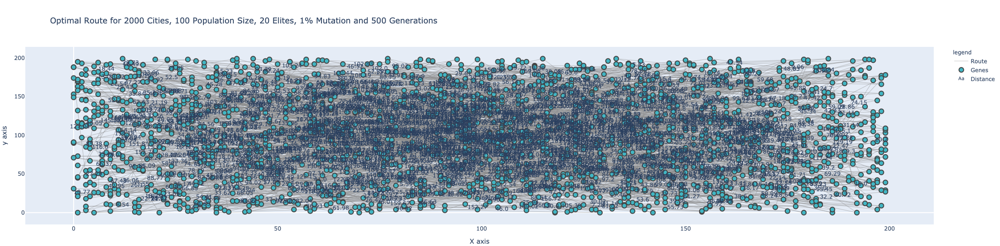

In [43]:
display(Image(filename = "../Images/Optimal_Route_for_2000_Cities_100_Population_Size_20 Elites_001_Mutation_and_500_Generations.png"))

## Results
Above in the first graph visualisation, we can see a graph displaying the locations of 30 cities and the optimal route taken by the GA displaying the coordinates of the cities and the distance between each city. 

The best route shown above has a total distance of 966.327700 which means a total reduction compared to the initial distance (2425.702566) of 1459.37 (2DP)

When trying to visualise a larger number of cities in a 2D graph such as 2000 cities as seen in the graph above, it becomes hard to interpret without zooming in on sections of the graph.

## Visualising Total Execution Times City Size Increases While not Changing Any other Parameters in GA Configuration
#### N cities, 100 population, 20 elites, 1% mutation, 500 generations

In [44]:
listPop = ['3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99']

figErrorBands = go.Figure([
    go.Scatter(
        x=listPop,
        y=execution_times_dataframe_df_99['Mean_execution_time'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines',
        name='Mean value'
    ),
    go.Scatter(
        x=listPop,
        y=execution_times_dataframe_df_99['Max_execution_time'],
        fill='tonexty',
        #marker=dict(color="#444"),
        fillcolor='rgba(0,100,80,0.2)',
        line=dict(width=0),
        hoverinfo="skip",
        showlegend=True,
        name='Upper Error band'
    ),
    go.Scatter(
        x=listPop,
        y=execution_times_dataframe_df_99['Min_execution_time'],
        fill='tonexty',
        #marker=dict(color="#444"),
        fillcolor='rgba(0,100,80,0.2)',
        line=dict(width=0),
        hoverinfo="skip",
        showlegend=True,
        name='Lower Error band'
    )],
    layout=go.Layout(
                    title='Total Execution Time as Number of Cities Increases by 1 city at a time',
                    margin=dict(b=30,l=30,r=30,t=100),
                    xaxis=dict(showgrid=True, zeroline=True, showticklabels=True),
                    yaxis=dict(showgrid=True, zeroline=True, showticklabels=True),
                    legend=dict(title='Legend'))
    )
figErrorBands.update_xaxes(type='log')
figErrorBands.update_yaxes(type='log')
figErrorBands.update_xaxes(title_text='Number of Cities')
figErrorBands.update_yaxes(title_text='Execution time (s)')
figErrorBands.show()

# Static Image Represenation of Visualisation

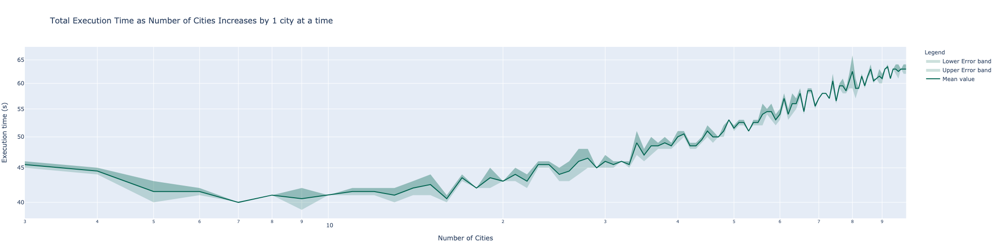

In [45]:
display(Image(filename = "../Images/Total_Execution_Time_as_Number_of_Cities_Increases_Line_3-99.png"))

The above graph dislays the mean execution time as a line plot. As the number of cities increases, the min and max execution times as upper and lower bound continuous error bands is used to display the deviation in overall execution time for each number of cities to satisfy mark scheme.
The upper and lower baound are quite small overall which inferes that mean execution time of data collected for each simulation is accurate. 

In [46]:
#building bar cahrt to show execution times
#listPop = cities_directory_list
listPop = ['25', '30', '50', '100', '150', '200', '250', '300', '400', '500', '600', '700', '800', '900','1000', '1100', '1200', '1300', '1400', '1500', '1600', '1700', '1800', '1900', '2000', '2100', '2200', '2300', '2400', '2500', '2600', '2700', '2800', '2900', '3000']
fig = px.line(execution_times_dataframe_df_3000, x=listPop, y='Mean_execution_time', title="Total Execution Time as Number of Cities Increases (25 - 3000)")
fig.update_traces(hovertemplate='Execution Time (S): %{y}')
fig.update_traces(mode="markers+lines")
fig.update_xaxes(title='Number of cities', type='log')
fig.update_yaxes(title='Execution time (s)', type='log')
fig.update_layout(hovermode="x unified")
fig.show()

# Static Image Represenation of Visualisation

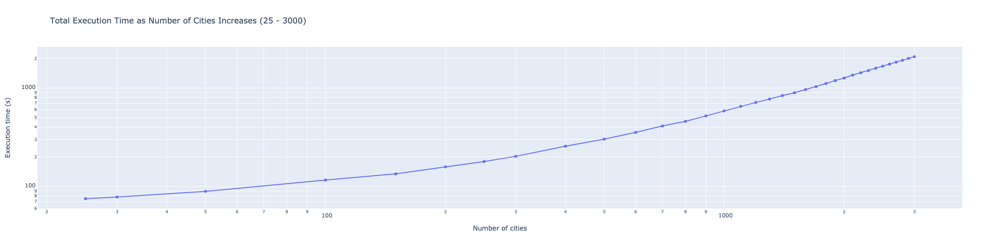

In [47]:
display(Image(filename = "../Images/Total_Execution_Time_as_Number_of_Cities_Increases_Line_25-3000.png"))

In [48]:
##making graph with error bands
figErrorBands = go.Figure([
    go.Scatter(
        x=listPop,
        y=execution_times_dataframe_df_3000['Mean_execution_time'],
        line=dict(color='rgb(0,100,80)'),
        mode='lines',
        name='Mean value'
    ),
    go.Scatter(
        x=listPop,
        y=execution_times_dataframe_df_3000['Max_execution_time'],
        fill='tonexty',
        #marker=dict(color="#444"),
        fillcolor='rgba(0,100,80,0.2)',
        line=dict(width=0),
        hoverinfo="skip",
        showlegend=True,
        name='Upper Error band'
    ),
    go.Scatter(
        x=listPop,
        y=execution_times_dataframe_df_3000['Min_execution_time'],
        fill='tonexty',
        #marker=dict(color="#444"),
        fillcolor='rgba(0,100,80,0.2)',
        line=dict(width=0),
        hoverinfo="skip",
        showlegend=True,
        name='Lower Error band'
    )],
    layout=go.Layout(
                    title='Average Total Execution, Min and Max Time as Number of Cities Increases (25-3000)',
                    margin=dict(b=30,l=30,r=30,t=100),
                    xaxis=dict(showgrid=True, zeroline=True, showticklabels=True),
                    yaxis=dict(showgrid=True, zeroline=True, showticklabels=True),
                    legend=dict(title='Legend'))
    )
figErrorBands.update_xaxes(type='log')
figErrorBands.update_yaxes(type='log')
figErrorBands.update_xaxes(title_text='Number of Cities')
figErrorBands.update_yaxes(title_text='Execution time (s)')
figErrorBands.show()

# Static Image Represenation of Visualisation

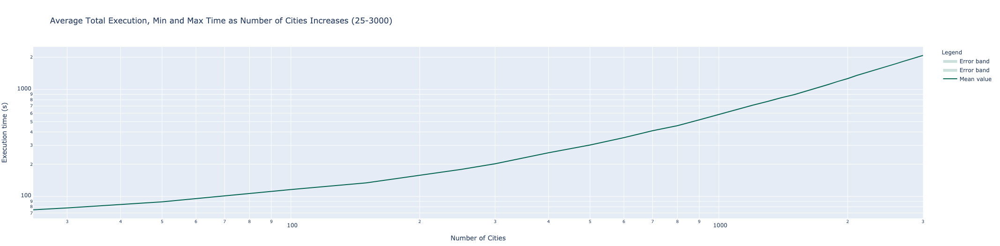

In [49]:
display(Image(filename = "../Images/Average_Total_Execution_Min_and_Max_Time_as_Number_of_Cities_Increases_25-3000.png"))

The above graph dislays the mean execution time as a line plot as the number of cities increases, the min and max time as upper and lower bound continuous error bands to satisfy mark scheme.
The upper and lowert bands are hard to distinguish from the mean executiuoin time. runs were increadibly similar regaridng execution times for each city count with a deviation of around 1 second.

We can see here that as the number of cities increases, the overall execution time deviation is relatively quite small. 

In [50]:
# building bar cahrt to show execution times
listPop = ['500','1000','1500','2000', '2500', '3000']
fig = px.line(execution_times_dataframe_df_3000[9::5], x=listPop, y='Mean_execution_time',title="Total Execution Time as Number of Cities Increases With a Step of 500")
fig.update_traces(hovertemplate='Execution Time (S): %{y}')
fig.update_traces(mode="markers+lines")
fig.update_xaxes(title='Number of cities', type='log')
fig.update_yaxes(title='Execution time (s)', type='log')
fig.update_layout(hovermode="x unified")
fig.show()

# Static Image Represenation of Visualisation

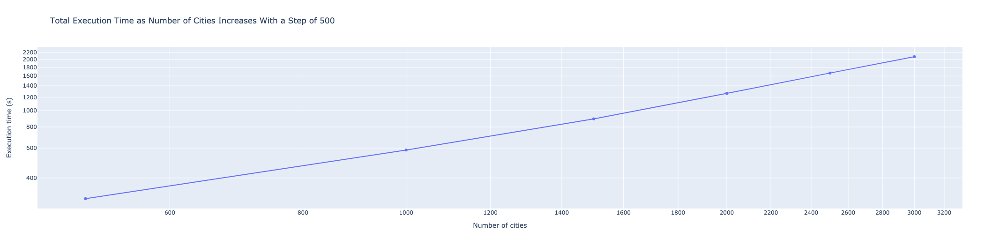

In [51]:
display(Image(filename = "../Images/Total_Execution_Time_as_Number_of_Cities_Increases_With_a_Step_of_500_Line.png"))

### Insights From Visualising Total Execution Times as The Number of Cities Increases

From the above results, it is possible to extrapulate that the run time complexity is $O(n\log{}n)$, where the total execution time increases linearly as the number of cities increases.
To determine this with certainty, 4 line plots are used which take larger and larger steps to extract away from any minor changes in the overal run times to conclude that $O(n\log{}n)$ is the runtime complexity for this implementation of the GA TSP.

## Loading All results for Increases in Generation Size While not Changing Any other Parameters in GA Configuration
### 500 cities, 100 population, 20 elites, 1% mutation, N generations

In [52]:
#building bar chart to show execution times
listPop = ['500','600','700','800','900','1000','1100','1200','1300','1400','1500']
fig = px.line(execution_dataframe_df_generations, x=listPop, y='Mean_execution_time',title="Execution Times for 500 Cities as The Number of Generations Increases by a Magnitude of 1000 in Steps of 100", log_x=True)
fig.update_traces(hovertemplate='Execution Time (S): %{y}')
fig.update_traces(mode="markers+lines")
fig.update_xaxes(title='Number of Generations', type='log')
fig.update_yaxes(title='Execution time (s)', type='log')
fig.update_layout(hovermode="x unified")

fig.show()

# Static Image Represenation of Visualisation

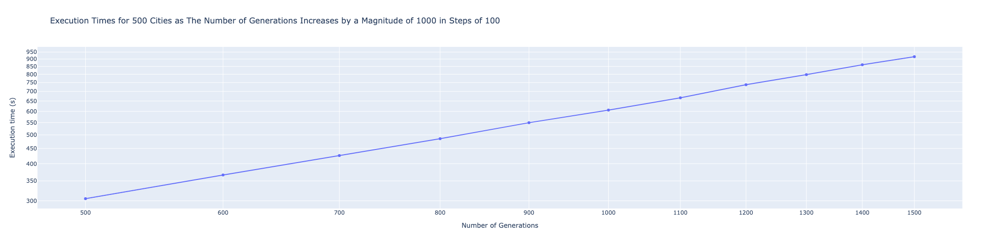

In [53]:
display(Image(filename = "../Images/Execution_Times_for_500_Cities_as_The_Number_of_Generations_Increases_by_a_Magnitude_of_1000_in_Steps_of_100_Line.png"))

### Insights From Visualising Total Execution Times as The Number of Generations Increases
To ensure with clarity that increasing generations while maintaining consitent values for all other variables within the GA did not result affect the overall runtime any differently from increasing only the number of cities.

As the above graph displays, while increasing the number generations, the rutime complexity is $O(n\log{}n)$

The results display that the number of generations is also an important consideration when selecting the parameters for a GA to solve the Travelling Salesman Problem. 

Speculatively based on the above results, one can argue that if both the number of cities and generations increased proportionately the overall runtime would increase by $O(2n\log{}2n)$

### Ploting results - Distance against generation

In [54]:
#initializing scatters to build the graph
cities_25 = go.Scatter(x=progress["25_cities"].index, y=progress["25_cities"].Mean_Distance, name="25 Cities" )
cities_30 = go.Scatter(x=progress["30_cities"].index, y=progress["30_cities"].Mean_Distance, name="30 Cities")
cities_100 = go.Scatter(x=progress["100_cities"].index, y=progress["100_cities"].Mean_Distance, name="100 Cities")
cities_150 = go.Scatter(x=progress["150_cities"].index, y=progress["150_cities"].Mean_Distance, name="150 Cities")
cities_200 = go.Scatter(x=progress["200_cities"].index, y=progress["200_cities"].Mean_Distance, name="200 Cities")
cities_250 = go.Scatter(x=progress["250_cities"].index, y=progress["250_cities"].Mean_Distance, name="250 Cities")
cities_300 = go.Scatter(x=progress["300_cities"].index, y=progress["300_cities"].Mean_Distance, name="300 Cities")
cities_400 = go.Scatter(x=progress["400_cities"].index, y=progress["400_cities"].Mean_Distance, name="400 Cities")
cities_500 = go.Scatter(x=progress["500_cities"].index, y=progress["500_cities"].Mean_Distance, name="500 Cities") # Step 500
cities_600 = go.Scatter(x=progress["600_cities"].index, y=progress["600_cities"].Mean_Distance, name="600 Cities")
cities_700 = go.Scatter(x=progress["700_cities"].index, y=progress["700_cities"].Mean_Distance, name="700 Cities")
cities_800 = go.Scatter(x=progress["800_cities"].index, y=progress["800_cities"].Mean_Distance, name="800 Cities")
cities_900 = go.Scatter(x=progress["900_cities"].index, y=progress["900_cities"].Mean_Distance, name="900 Cities")
cities_1000 = go.Scatter(x=progress["1000_cities"].index, y=progress["1000_cities"].Mean_Distance, name="1000 Cities") # Step 500
cities_1100 = go.Scatter(x=progress["1100_cities"].index, y=progress["1100_cities"].Mean_Distance, name="1100 Cities")
cities_1200 = go.Scatter(x=progress["1200_cities"].index, y=progress["1200_cities"].Mean_Distance, name="1200 Cities")
cities_1300 = go.Scatter(x=progress["1300_cities"].index, y=progress["1300_cities"].Mean_Distance, name="1300 Cities")
cities_1400 = go.Scatter(x=progress["1400_cities"].index, y=progress["1400_cities"].Mean_Distance, name="1400 Cities")
cities_1500 = go.Scatter(x=progress["1500_cities"].index, y=progress["1500_cities"].Mean_Distance, name="1500 Cities") # Step 500
cities_1600 = go.Scatter(x=progress["1600_cities"].index, y=progress["1600_cities"].Mean_Distance, name="1600 Cities")
cities_1700 = go.Scatter(x=progress["1700_cities"].index, y=progress["1700_cities"].Mean_Distance, name="1700 Cities")
cities_1800 = go.Scatter(x=progress["1800_cities"].index, y=progress["1800_cities"].Mean_Distance, name="1800 Cities")
cities_1900 = go.Scatter(x=progress["1900_cities"].index, y=progress["1900_cities"].Mean_Distance, name="1900 Cities")
cities_2000 = go.Scatter(x=progress["2000_cities"].index, y=progress["2000_cities"].Mean_Distance, name="2000 Cities") # Step 500
cities_2100 = go.Scatter(x=progress["2100_cities"].index, y=progress["2100_cities"].Mean_Distance, name="2100 Cities")
cities_2200 = go.Scatter(x=progress["2200_cities"].index, y=progress["2200_cities"].Mean_Distance, name="2200 Cities")
cities_2300 = go.Scatter(x=progress["2300_cities"].index, y=progress["2300_cities"].Mean_Distance, name="2300 Cities")
cities_2400 = go.Scatter(x=progress["2400_cities"].index, y=progress["2400_cities"].Mean_Distance, name="2400 Cities")
cities_2500 = go.Scatter(x=progress["2500_cities"].index, y=progress["2600_cities"].Mean_Distance, name="2600 Cities")
cities_2600 = go.Scatter(x=progress["2600_cities"].index, y=progress["2500_cities"].Mean_Distance, name="2500 Cities") # Step 500
cities_2700 = go.Scatter(x=progress["2700_cities"].index, y=progress["2700_cities"].Mean_Distance, name="2700 Cities") 
cities_2800 = go.Scatter(x=progress["2800_cities"].index, y=progress["2800_cities"].Mean_Distance, name="2800 Cities") 
cities_2900 = go.Scatter(x=progress["2900_cities"].index, y=progress["2900_cities"].Mean_Distance, name="2900 Cities") 
cities_3000 = go.Scatter(x=progress["3000_cities"].index, y=progress["3000_cities"].Mean_Distance, name="3000 Cities") # Step 500
# cities_3000 = go.Scatter(x=result3000_cities.index, y=result3000_cities.Distance, name="3000 Cities") # Step 500

### Visualise with a Step Increase of 100 Cities From 100 - 3000

In [55]:
#building graph figure with initilized scatter data
figNew = go.Figure(
    data=[cities_100, cities_200, cities_300, cities_400, cities_500, cities_600, cities_700, cities_800, cities_900, cities_1000, cities_1100, cities_1200, cities_1300, cities_1400, cities_1500, cities_1600, cities_1700, cities_1800, cities_1900, cities_2000, cities_2000, cities_2000, cities_2100, cities_2200, cities_2300, cities_2400, cities_2500, cities_2600, cities_2700, cities_2800, cities_2900, cities_3000],
    layout=go.Layout(title='Average Optimisation Per Generation as The Number of Cities Increases <br>(Double click legend and select 1 at a time)')
)
#setting axis names
figNew.update_xaxes(title_text='Generations')
figNew.update_yaxes(title_text='Distance')
figNew.show()

# Static Image Represenation of Visualisation - 3000 Cities Only as all Data is overwhelming in Static Image Form

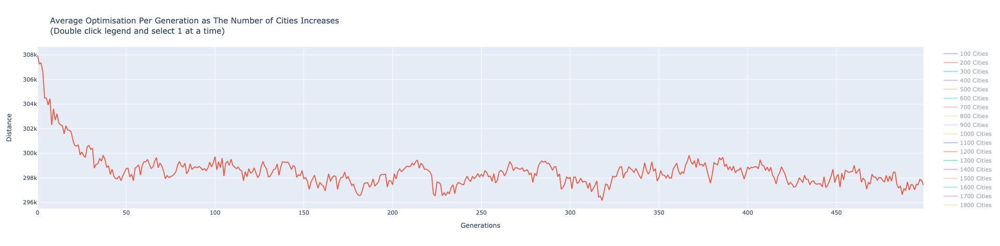

In [56]:
display(Image(filename = "../Images/Optimisation_Per_Generation_as_The_Number_of_Cities_Increases_Line.png"))

## Visualise with a Step Increase of 500 Cities From 500 - 3000

In [57]:
#building graph figure with initilized scatter data

figNew = go.Figure(
    data=[cities_500, cities_1000, cities_1500, cities_2000, cities_2500, cities_3000],
    layout=go.Layout(title='Average Optimisation Per Generation as The Number of Cities Increases with a Step of 500 <br>(Double click legend and select 1 at a time)')
)
#setting axis names
figNew.update_xaxes(title_text='Generations')
figNew.update_yaxes(title_text='Distance')
figNew.show()

# Static Image Represenation of Visualisation

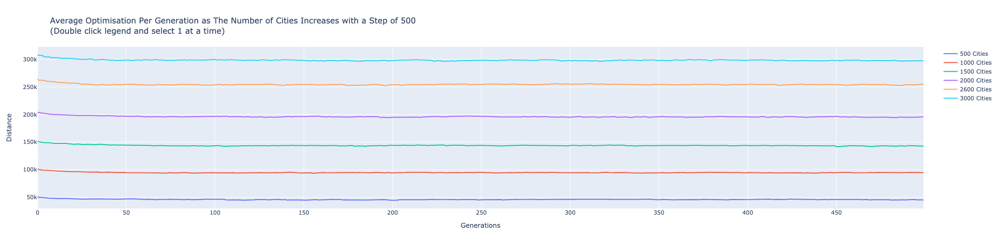

In [58]:
display(Image(filename = "../Images/Optimisation_Per_Generation_as_The_Number_of_Cities_Increases_with_a_Step_of_500_Line.png"))

## Visualise with a Step Increase of 1 Cities From 3 - 99

In [59]:
# progress_99
data_list = []
for i in cities_directory_list_99:
    data_list.append(go.Scatter(x=progress_99[f"{i}_cities"].index, y=progress_99[f"{i}_cities"].Mean_Distance, name=f"{i} Cities" ))

figNew = go.Figure(
    data=data_list,
    layout=go.Layout(title='Average Optimisation Per Generation as The Number of Cities Increases with a Step of 1 <br>(Double click legend and select 1 at a time)')
)
#setting axis names
figNew.update_xaxes(title_text='Generations')
figNew.update_yaxes(title_text='Distance')
figNew.show()

# Static Image Represenation of Visualisation - 5, 10, 15, 20, 25 and 30 Cities Only as all Data is overwhelming in Static Image Form

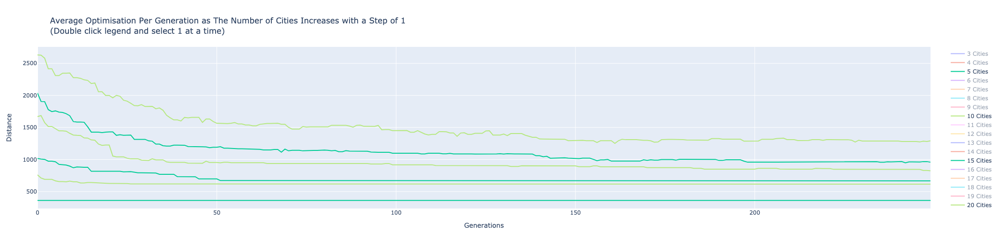

In [60]:
display(Image(filename = "../Images/Optimisation_Per_Generation_as_The_Number_of_Cities_Increases_with_a_Step_of_1_Line.png"))

### Insights From Visualising Distance Optimisation Per Generation as The Number of Cities Increases
Above are two visualisations displaying the distance per generation as the number of cities increases both in fine detail with steps of 100 and from a more abstract view at 500 step increments for the number of cities.

Both visualisations clearly show a pattern in that the difference from the initial distance to the shortest distance found when only modifying the number of cities shares a similar ratio no matter how many cities are added.

As a last minute addition to results above to reflect the scale of cities (3-99) utiliesed for ACO and Greedy simulations, Additional simulations view look at and analyse the Genetic Algorithms approach to within a range of 3-99 cities is displayed above. 
What we can see from the above graph is that for the first 15 cities, the most optimal tour is found roughly within the first 50 generations. Once this number of cities is reached, the number of generations taken to find the most optimal route becomes less consistent in that the mutation begins to play a more significant role in the genetic algorithms approach to finding an optimal solution where the most optimal solution may or may not have already been found by the genetic algorithm. The mutation mutation swaps cities in an attempt to avoid local convergence.  

To look at the results with more clarity, further down in this notebook are visualisations displaying the differences in distance saved as the number of cities increases and the second visualisation displaying the number of generations before the optimal distance found as the number of cities increases to confirm the patern found in the above two graphs displaying the distance per generation as the number of cities increases.

In [61]:
data_list = []
data_list.append(go.Scatter(x=generations_progress["500_cities"].index, y=generations_progress["500_cities"].Mean_Distance, name="500 Generations"))
data_list.append(go.Scatter(x=generations_progress["600_cities"].index, y=generations_progress["600_cities"].Mean_Distance, name="600 Generations"))
data_list.append(go.Scatter(x=generations_progress["700_cities"].index, y=generations_progress["700_cities"].Mean_Distance, name="700 Generations"))
data_list.append(go.Scatter(x=generations_progress["800_cities"].index, y=generations_progress["800_cities"].Mean_Distance, name="800 Generations"))
data_list.append(go.Scatter(x=generations_progress["900_cities"].index, y=generations_progress["900_cities"].Mean_Distance, name="900 Generations"))
data_list.append(go.Scatter(x=generations_progress["1000_cities"].index, y=generations_progress["1000_cities"].Mean_Distance, name="1000 Generations"))
data_list.append(go.Scatter(x=generations_progress["1100_cities"].index, y=generations_progress["1100_cities"].Mean_Distance, name="1100 Generations"))
data_list.append(go.Scatter(x=generations_progress["1200_cities"].index, y=generations_progress["1200_cities"].Mean_Distance, name="1200 Generations"))
data_list.append(go.Scatter(x=generations_progress["1300_cities"].index, y=generations_progress["1300_cities"].Mean_Distance, name="1300 Generations"))
data_list.append(go.Scatter(x=generations_progress["1400_cities"].index, y=generations_progress["1400_cities"].Mean_Distance, name="1400 Generations"))
data_list.append(go.Scatter(x=generations_progress["1500_cities"].index, y=generations_progress["1500_cities"].Mean_Distance, name="1500 Generations"))

#building graph figure with initilized scatter data
figNew = go.Figure(
    data=data_list,
    layout=go.Layout(title='Optimisation Per Generation as The Number of Generations Increases for a Fixed Number of Cities <br>(Double click legend and select 1 at a time)')
)
#setting axis names
figNew.update_xaxes(title_text='Generations')
figNew.update_yaxes(title_text='Distance')
figNew.show()

# Static Image Represenation of Visualisation

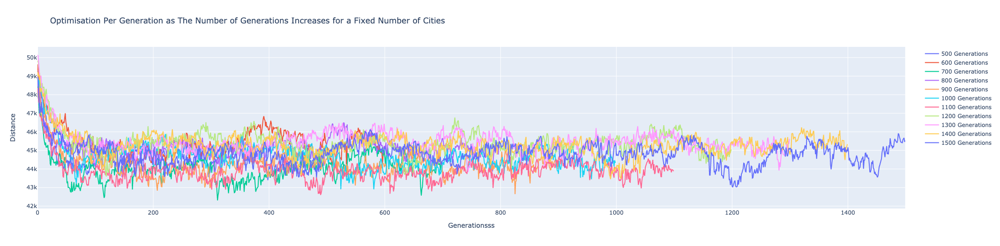

In [62]:
display(Image(filename = "../Images/Optimisation_Per_Generation_as_The_Number_of_Generations_Increases_for_a_Fixed_Number_of_Cities_Line.png"))

### Insights From Visualising Distance Optimisation Per Generation as The Number of Generations Increases
The above visualisation is trying to determine if local convergance is ever reached with only 1% mutation. 
This visualisation clearly displays that local convergance is successfully avoided as the number of generations is increased from 500 and 1500 generations and that similarly to previous visualisations, the majority of route optimisation takes place within the first 200 generations.

## Visualise Execution Times Per Generation as The Number of Cities Increases

In [63]:
time_per_gen = []

time_per_gen.append(go.Bar(x=progress["100_cities"].index, y=progress["100_cities"].Distance, name="100 cities"))
time_per_gen.append(go.Bar(x=progress["150_cities"].index, y=progress["150_cities"].Distance, name="150 cities"))
time_per_gen.append(go.Bar(x=progress["200_cities"].index, y=progress["200_cities"].Distance, name="200 cities"))
time_per_gen.append(go.Bar(x=progress["250_cities"].index, y=progress["250_cities"].Distance, name="250 cities"))
time_per_gen.append(go.Bar(x=progress["300_cities"].index, y=progress["300_cities"].Distance, name="300 cities"))
time_per_gen.append(go.Bar(x=progress["400_cities"].index, y=progress["400_cities"].Distance, name="400 cities"))
time_per_gen.append(go.Bar(x=progress["500_cities"].index, y=progress["500_cities"].Distance, name="500 cities"))  # Step 500
time_per_gen.append(go.Bar(x=progress["600_cities"].index, y=progress["600_cities"].Distance, name="600 cities"))
time_per_gen.append(go.Bar(x=progress["700_cities"].index, y=progress["700_cities"].Distance, name="700 cities"))
time_per_gen.append(go.Bar(x=progress["800_cities"].index, y=progress["800_cities"].Distance, name="800 cities"))
time_per_gen.append(go.Bar(x=progress["900_cities"].index, y=progress["900_cities"].Distance, name="900 cities"))
time_per_gen.append(go.Bar(x=progress["1000_cities"].index, y=progress["1000_cities"].Distance, name="1000 cities"))  # Step 500
time_per_gen.append(go.Bar(x=progress["1100_cities"].index, y=progress["1100_cities"].Distance, name="1100 cities"))
time_per_gen.append(go.Bar(x=progress["1200_cities"].index, y=progress["1200_cities"].Distance, name="1200 cities"))
time_per_gen.append(go.Bar(x=progress["1300_cities"].index, y=progress["1300_cities"].Distance, name="1300 cities"))
time_per_gen.append(go.Bar(x=progress["1400_cities"].index, y=progress["1400_cities"].Distance, name="1400 cities"))
time_per_gen.append(go.Bar(x=progress["1500_cities"].index, y=progress["1500_cities"].Distance, name="1500 cities"))  # Step 500
time_per_gen.append(go.Bar(x=progress["1600_cities"].index, y=progress["1600_cities"].Distance, name="1600 cities"))
time_per_gen.append(go.Bar(x=progress["1700_cities"].index, y=progress["1700_cities"].Distance, name="1700 cities"))
time_per_gen.append(go.Bar(x=progress["1800_cities"].index, y=progress["1800_cities"].Distance, name="1800 cities"))
time_per_gen.append(go.Bar(x=progress["1900_cities"].index, y=progress["1900_cities"].Distance, name="1900 cities"))
time_per_gen.append(go.Bar(x=progress["2000_cities"].index, y=progress["2000_cities"].Distance, name="2000 cities"))  # Step 500
time_per_gen.append(go.Bar(x=progress["2100_cities"].index, y=progress["2100_cities"].Distance, name="2100 cities"))
time_per_gen.append(go.Bar(x=progress["2200_cities"].index, y=progress["2200_cities"].Distance, name="2200 cities"))
time_per_gen.append(go.Bar(x=progress["2300_cities"].index, y=progress["2300_cities"].Distance, name="2300 cities"))
time_per_gen.append(go.Bar(x=progress["2400_cities"].index, y=progress["2400_cities"].Distance, name="2400 cities"))
time_per_gen.append(go.Bar(x=progress["2500_cities"].index, y=progress["2500_cities"].Distance, name="2500 cities"))  # Step 500
time_per_gen.append(go.Bar(x=progress["2600_cities"].index, y=progress["2600_cities"].Distance, name="2600 cities"))
time_per_gen.append(go.Bar(x=progress["2700_cities"].index, y=progress["2700_cities"].Distance, name="2700 cities"))
time_per_gen.append(go.Bar(x=progress["2800_cities"].index, y=progress["2800_cities"].Distance, name="2800 cities"))
time_per_gen.append(go.Bar(x=progress["2900_cities"].index, y=progress["2900_cities"].Distance, name="2900 cities"))
time_per_gen.append(go.Bar(x=progress["3000_cities"].index, y=progress["3000_cities"].Distance, name="3000 cities"))  # Step 500


fig = go.Figure(
    data=time_per_gen,
    layout=go.Layout(title='Execution Times Per Genetation as The Number of Cities Increases - Double click legend and select one at a time for optimal viewing')
)

fig.update_xaxes(title='Number of cities')
fig.update_yaxes(title='Execution time (s)')
fig.show()

# Static Image Represenation of Visualisation - 1800 Cities Only for run 1 as to Average Run; Viewing All Cities Statically would be Impractical. It is Recommended to view this Graph Using Plotly Above Locally

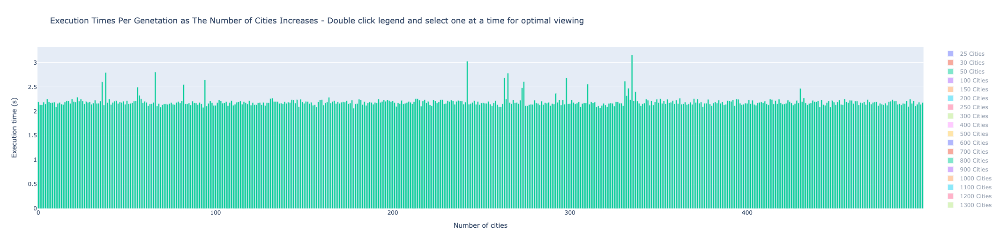

In [64]:
display(Image(filename = "../Images/Execution_Times_Per_Genetation_as_The_Number_of_Cities_Increases_1800_Only.png"))

### Insights From Visualising Distance Optimisation Per Generation as The Number of Generations Increases
When viewing each city individaully, randomly, spikes in the total execution time for a given generation appear. The system which ran all of the above simulations was performing no other tasks than the simulations.
Speculatively, It would be infered that such spikes are just random anomalies that may be system dependent and not a result of the Genetic Algorithm in itself due to their random nature.

WHen displaying the avarage time across 3 iterations of the same simulation which can be see in the interactive plotly graph locally, times are relatively stable to back the above point that anomolies in execution time for a given generation as likely external to the algorithms performance.

## Determining What The Effect of Mutation Has on The Overall Optimisation Performance

Below we now take a closer look at how changing the mutation rate effects the overall performance of the Genetic Algorithm approach to solving the Travelling Salesman Problem

## Visualising Progress for Different Mutation Rates

In [65]:
mutation_data_list = []
#initializing scatters to build the graph
mutation_data_list.append(go.Scatter(x=mutations_progress["001_cities"].index, y=mutations_progress["001_cities"].Mean_Distance, name="0.01%"))
mutation_data_list.append(go.Scatter(x=mutations_progress["0015_cities"].index, y=mutations_progress["0015_cities"].Mean_Distance, name="0.015%"))
mutation_data_list.append(go.Scatter(x=mutations_progress["0025_cities"].index, y=mutations_progress["0025_cities"].Mean_Distance, name="0.025%"))
mutation_data_list.append(go.Scatter(x=mutations_progress["005_cities"].index, y=mutations_progress["005_cities"].Mean_Distance, name="0.005%"))
mutation_data_list.append(go.Scatter(x=mutations_progress["0075_cities"].index, y=mutations_progress["0075_cities"].Mean_Distance, name="0.075%"))
mutation_data_list.append(go.Scatter(x=mutations_progress["010_cities"].index, y=mutations_progress["010_cities"].Mean_Distance, name="0.10%"))
mutation_data_list.append(go.Scatter(x=mutations_progress["020_cities"].index, y=mutations_progress["020_cities"].Mean_Distance, name="0.20%"))

#building graph figure with initilized scatter data
figMutation = go.Figure(
    data=mutation_data_list,
    layout=go.Layout(
        title='Optimisation Per Generation for a Fixed Number of Cities as The Percentage of Mutation Changes',
    )
)

figMutation.update_xaxes(title_text='Generations')
figMutation.update_yaxes(title_text='Distance')
figMutation.show()

# Static Image Represenation of Visualisation

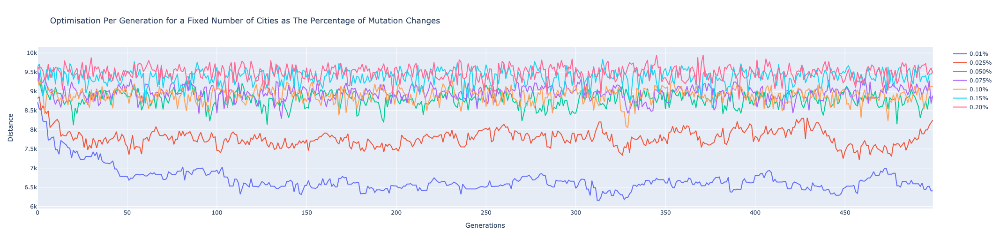

In [66]:
display(Image(filename = "../Images/Optimisation_Per_Generation_for_a_Fixed_Number_of_Cities_as_The_Percentage_of_Mutation_Changes_Line.png"))

### Insights From Visualising Optimisation Per Generation as The Percentage of Mutation Increases

In the above graph, the lower the percentage of mutation starting at 1%, the overall performance of the GA is better for 500 cities. Speculatively, I would infer based on results that this is likely the case as the number of cities and generations increases proportionate to each other. 

The above graph also highlights that the percentages of mutation greater than 2.5% will result in similar results producing little to not optimisation from the intial distance. This is likely becasue the variance is so large that results become entirely random.

## Comparison of Genetic algorithms against Greedy

### Loading data for the comparison 

In [67]:
acoTimesData = pd.read_csv(filepath_or_buffer="../ACO/times_for_ACO.csv", index_col=0)
greedyTimesData = pd.read_csv(filepath_or_buffer="../ACO/timesForGreedy.csv", index_col=0)
gaData = pd.read_csv(filepath_or_buffer="../ACO/timesForGa.csv", index_col=0)
gaData_250 = pd.read_csv(filepath_or_buffer="../ACO/timesForGreedy_250.csv", index_col=0)

In [68]:
##making graph with error bands
numberOfVerticesForEachCost = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]

figGavsGreedy = go.Figure([
    go.Scatter(
        x=greedyTimesData['Times'],
        y=numberOfVerticesForEachCost,
        line=dict(color='rgb(255,105,180)'),
        mode='lines',
        name='Greedy',
    ),
     go.Scatter(
        x=gaData['execution_time'],
        y=numberOfVerticesForEachCost,
        line=dict(color='rgb(30,144,255)'),
        mode='lines',
        name='Ga (1 generations)',
        opacity=0.5
    ),
     go.Scatter(
        x=execution_times_dataframe_df_99['Mean_execution_time'],
        y=numberOfVerticesForEachCost,
        line=dict(color='rgb(0,500,40)'),
        mode='lines',
        name='Ga (250 generations)'
    )],
    
    layout=go.Layout(
                    title='Genetic algorithms agains Greedy',
                    margin=dict(b=30,l=30,r=30,t=100),
                    xaxis=dict(showgrid=True, zeroline=True, showticklabels=True),
                    yaxis=dict(showgrid=True, zeroline=True, showticklabels=True),
                    legend=dict(title='Legend'))
    )
figGavsGreedy.update_xaxes(title_text='Execution time (s)')
figGavsGreedy.update_yaxes(title_text='Number of cities')
figGavsGreedy.show()

# Static Image Represenation of Visualisation

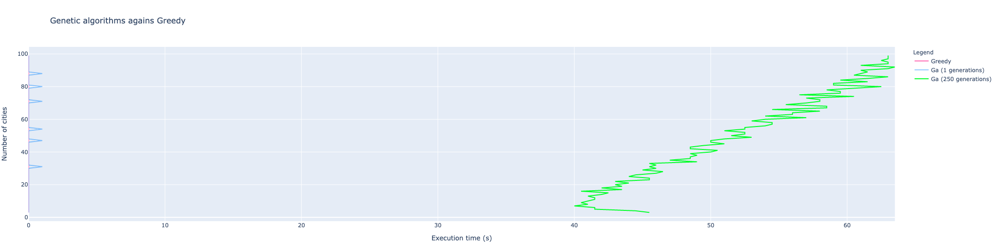

In [69]:
display(Image(filename = "../Images/GA_GR_comparison.png"))

Based on the results for execution time against 100 cities, Greedy outperforms both Genetic algorithm approaches. However, in terms of overall distance saved which cannot be represented easily in the form of a graph due to differences in the architecture.
Genetic algorithms rely on a number of generations to optimize a tour for a given number of cities. As such, the overall execution time of the genetic algorithms is not only dependant on the number of cities but also the number of generations and other subtleties in the overall configuration of the gentic algorithm such as; population size, mutation percentile and elite size. 

The execution of the genetic algorithm with one generation only for 100 cities will result in negligible overall optimisation from the initial distance. The justification for displaying just one generation within the above visualisation is to show the difference in performance to the Greedy approach while negating parameter such as generations, which normally plays an important role in optimisation.

The Genetic algorithm does however outperform Greedy in terms of overall optimisation from the initial distance as the number of cities increases, as described by the Big O notation. 

# Comparison of all algorithms

In [70]:

##making graph with error bands
numberOfVerticesForEachCost = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]

figAlgoCompate = go.Figure([
    go.Scatter(
        x=acoTimesData['Times'],
        y=numberOfVerticesForEachCost,
        line=dict(color='rgb(0,100,80)'),
        mode='lines',
        name='ACO'
    ),
    go.Scatter(
        x=greedyTimesData['Times'],
        y=numberOfVerticesForEachCost,
        line=dict(color='rgb(255,105,180)'),
        mode='lines',
        name='Greedy',
    ),
     go.Scatter(
        x=gaData['execution_time'],
        y=numberOfVerticesForEachCost,
        line=dict(color='rgb(30,144,255)'),
        mode='lines',
        name='Ga (1 generations)',
        opacity=0.5
    ),
     go.Scatter(
        x=gaData_250['execution_time'],
        y=numberOfVerticesForEachCost,
        line=dict(color='rgb(0,500,40)'),
        mode='lines',
        name='Ga (250 generations)'
    )],
    
    layout=go.Layout(
                    title='Algorithm comparison',
                    margin=dict(b=30,l=30,r=30,t=100),
                    xaxis=dict(showgrid=True, zeroline=True, showticklabels=True),
                    yaxis=dict(showgrid=True, zeroline=True, showticklabels=True),
                    legend=dict(title='Legend'))
    )
figAlgoCompate.update_xaxes(title_text='Execution time (s)')
figAlgoCompate.update_yaxes(title_text='Number of cities')
figAlgoCompate.show()

# Static Image Represenation of Visualisation

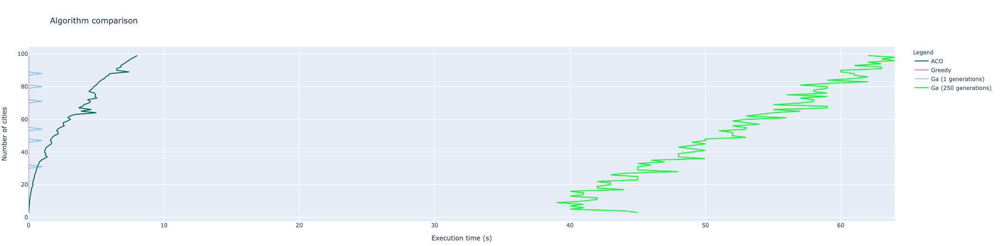

In [71]:
display(Image(filename = "../Images/GA_ACO_GR_comparison.png"))

# Conclusion 

To sum up, with the execution and comparison of the three algorithms, in first instance,  we understood that a comparison based on the execution times might no be straight forward due to the nature of the algotithms. 
Genetic algorithms makes use of generations in its base concept to come up with path solutions for the travelling sales man problem (TSP). 
For the present comparison of algorithms, tests were run using just 1 generation in an attempt to try and approximate results from Ant-colonisation and Greedy algorithms. Due to this, we were able to conclude that running the present implementation of the Genetic Algorithm might not be a solid approach attending to the efficacy of the results plotted. 

On the overall scenario, based on the plotted results above and the runtime complexity analysis of the algorithms we can conclude that ACO would be the optimal approach for solving the travelling salesman problem (TSP) out of those approached included in this notebook.

For a small number of cities, up to 20, greedy outperforms ACO and Genetic algorithms in terms of overall execution time when determining the most optimal tour. 
For a number of cities larget than 20, ACO starts to outperform both Greedy and Genetic algorithm approaches. 

From another perspective, Genetic algorithms, despite being more complex to implement allows for more configuration in the creatio of simulations to determine an optimal tour as can be seen by the example implemetation in the GA section of the notebook as a commented out section of code. 



# Additional Vislulations To Add

In [ ]:
# Below code is a test to get the minimum distance and the id of the minimum distance

resultTest = pd.read_csv(filepath_or_buffer="../cities/25_cities/run_1/GA_TSP_25city_100popsize_20elite_001mut_500gen_progress.csv", index_col=0)
df_initial_distance = resultTest.head(1) # gets row containing intial distance (first row in dataframe)
df_minimum_distance = resultTest['Distance'].min() # gets minimum distance

df_min_distances = resultTest.loc[resultTest['Distance'] == resultTest['Distance'].min()] # Gets id's of minimum distance
df_min_distances.head(1).index[0] # ID of first generation to get minimum distance

#index, cities, initial distance, optimal distance, generation found
#use the dataframes from the already loaded csv's and create a list the all the columns for each nr of cities
#https://www.geeksforgeeks.org/different-ways-to-create-pandas-dataframe/

# References

* Prado, K. (2019). Understanding time complexity with Python examples. towards data science, from https://towardsdatascience.com/understanding-time-complexity-with-python-examples-2bda6e8158a7

* Zeinab, E. (2020). Ant Colony Optimization - an overview | ScienceDirect Topics. Sciencedirect.com, from https://www.sciencedirect.com/topics/engineering/ant-colony-optimization

* Gupta, R. (2019). Solving Travelling Salesman Problem using Ant Colony Optimization. GitHub, from https://github.com/rochakgupta/aco-tsp

* Fenwa, D., Adeyanju, I., & Adeosun, O. (2014). Performance Evaluation of Ant Colony Optimization Algorithm and Genetic Algorithm in Travelling Salesman Problem. International Journal Of Application Or Innovation In Engineering & Management (IJAIEM), 3(11), 243-249

* me, T. (2021). Applying a genetic algorithm to the traveling salesman problem. Retrieved 9 April 2021, from https://www.theprojectspot.com/tutorial-post/applying-a-genetic-algorithm-to-the-travelling-salesman-problem/5

* Genetic Algorithms - Parent Selection - Tutorialspoint. (2021). Retrieved 9 April 2021, from https://www.tutorialspoint.com/genetic_algorithms/genetic_algorithms_parent_selection.htm

* Pseudocode 1 | Prediction of Pathological Subjects Using Genetic Algorithms. (2021). Retrieved 9 April 2021, from https://www.hindawi.com/journals/cmmm/2018/6154025/psdc1/

* Stolz, E. (2021). Evolution of a salesman: A complete genetic algorithm tutorial for Python. Retrieved 6 April 2021, from https://towardsdatascience.com/evolution-of-a-salesman-a-complete-genetic-algorithm-tutorial-for-python-6fe5d2b3ca35

* Travelling salesman problem - Wikipedia. (2021). Retrieved 7 April 2021, from https://en.wikipedia.org/wiki/Travelling_salesman_problem